# Mouse spleen (cellbin) DIRAC for spatial localization of immune cells

- by CHANG XU changxu@nus.edu.sg.
- Last update: October 4th 2024

## Download the data （Under review, will be provided later）
- if you are have ``wget`` installed, you can run the following code to automatically download and unzip the data.

In [ ]:
# Skip this cells if data are already download
! wget -O C03833D6_cellbin_Protein.h5ad "*******"
! wget -O C03833D6_cellbin_domain_to_cellbin.h5ad "*******"

- if you do not have wget installed, manually download data from the links below:
    - Mouse spleen cellbin collected from ADT: 
    - Mouse spleen cellbin from Protein: 

## Step 1: Align the cellbin data with the bin100 data using Stereopy
- This step is to remove the position of the mouse spleen capsule.

In [77]:
import os 
import sys
import random
import pandas as pd 
import numpy as np 
import torch
import scanpy as sc
import anndata
import matplotlib.pyplot as plt
import time

data_path = "/home/project/11003054/changxu/Data/Stereo_cite_seq/C03833D6/Data"
data_name = "C03833D6_bin100"
methods = "Dirac"
save_path = '/home/project/11003054/changxu/Projects/SpaGNNs//Review/Re_2024_10_29/section5/Results/C03833D6_bin100_Dirac/20240925142432'
adata_RNA = sc.read(os.path.join(save_path,f"{data_name}_{methods}_RNA_20240925142432.h5ad"))
adata_Protein = sc.read(os.path.join(save_path,f"{data_name}_{methods}_Protein_20240925142432.h5ad"))
adata_RNA = adata_RNA.raw.to_adata()
adata_Protein = adata_Protein.raw.to_adata()

# create a dictionary to map cluster to annotation label
cluster2annotation = {
    "C_1": "Marginal zone",
    "C_2": "Capsule",
    "C_3": "White pulp",
    "C_4": "Blood vessel",
    "C_5": "Red pulp",
}
# add a new `.obs` column called `cell type` by mapping clusters to annotation using pandas `map` function
adata_RNA.obs["region_domain"] = adata_RNA.obs['Combined_region'].map(cluster2annotation).astype("category")
########### save colors
cluster2colors = {
    "Marginal zone": '#000004ff',
    "Capsule": '#57106eff',
    "White pulp": '#bc3754ff',
    "Blood vessel":'#f98e09ff',
    "Red pulp":'#fcffa4ff',
}
sc.pl.spatial(adata_RNA, color=["region_domain"], palette=cluster2colors, frameon=False, spot_size=200, show=False)
adata_RNA.write(os.path.join(save_path, f"{data_name}_{methods}_RNA_cluster_cellbin.h5ad"))

In [78]:
################### 将bin100和cellbin的数据进行对齐。
import os 
import sys
import random
import pandas as pd 
import numpy as np 
import scanpy as sc
import anndata
import matplotlib.pyplot as plt
import time
import stereo as st
data_path = "/home/project/11003054/changxu/Data/Stereo_cite_seq"
save_path = '/home/project/11003054/changxu/Projects/SpaGNNs//Review/Re_2024_10_29/section5/Results/C03833D6_bin100_Dirac/20240925142432'
data_name = "C03833D6_bin100"
methods = "Dirac"

adata_cellbin = st.io.read_h5ad(file_path="/home/project/11003054/changxu/Data/Stereo_cite_seq/C03833D6/Data/C03833D6_cellbin_RNA.h5ad")
adata_RNA_bin100 = st.io.read_h5ad(file_path=os.path.join(save_path, f"{data_name}_{methods}_RNA_cluster_cellbin.h5ad"))

st.utils.cluster_bins_to_cellbins(adata_RNA_bin100, adata_cellbin, 'region_domain')
adata_cellbin.cells["region_domain_from_bin100"] = adata_cellbin.cells["region_domain_from_bins"]
st.io.stereo_to_anndata(adata_cellbin, flavor='scanpy',output=os.path.join("/home/project/11003054/changxu/Data/Stereo_cite_seq/C03833D6/Data/C03833D6_cellbin_domain_to_cellbin.h5ad"))

## Step 2: Run the horizontal integration task of DIRAC
- Annotation using ADT + RNA
- Annotation using RNA only
- Annotation using ADT only

### Step 2.1: ADT+RNA
- Load packages and data, including CITE-seq and Stereo-CITE-seq.
- Filter data and preprocess
- Run DIRAC's horizontal integration task
- Visualize the spatial distribution of mouse spleen cells

In [1]:
import torch
import numpy as np
from builtins import range
from torch_geometric.data import InMemoryDataset, Data
from sklearn.metrics import pairwise_distances
import time
import spateo as st
import seaborn as sns

import pandas as pd
import anndata
import os 
import sys
import random
import matplotlib.pyplot as plt
import scanpy as sc
import logging
import sklearn
from collections import Counter
import yaml

sys.path.append("/home/project/11003054/changxu/Projects/SpaGNNs/Final_code/spagnns")
from main import annotate_app
from utils import get_single_edge_index, get_multi_edge_index, lsi

2024-11-08 13:50:51.669661: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-11-08 13:50:51.672550: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-11-08 13:50:51.680354: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-08 13:50:51.692865: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-08 13:50:51.696618: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-08 13:50:51.706408: I tensorflow/core/platform/cpu_feature_gu

[easydl] tensorflow not available!


In [2]:
def seed_torch(seed=1029):   
    random.seed(seed)    
    os.environ['PYTHONHASHSEED'] = str(seed)    
    np.random.seed(seed)    
    torch.manual_seed(seed)    
    torch.cuda.manual_seed(seed)    
    torch.cuda.manual_seed_all(seed) 
    # if you are using multi-GPU.    
    torch.backends.cudnn.benchmark = False    
    torch.backends.cudnn.deterministic = True

seed_torch(seed=8)

In [3]:
############## First, process the data
# Define the file paths and variables
data_path = "/home/project/11003054/changxu/Data/Stereo_cite_seq/C03833D6"
data_name = "C03833D6_cellbin"
methods = "Dirac"
use_obs_name = "cell_types"
results_path = "/home/project/11003054/changxu/Projects/SpaGNNs/Review/Re_2024_10_29/section5/Results/"
now = time.strftime("%Y%m%d%H%M%S", time.localtime(time.time()))

# Define the colormap for different cell types
colormaps = ['#ffff00', '#1ce6ff', '#ff34ff', '#ff4a46', '#008941', '#006fa6', '#a30059', '#ffdbe5', 
             '#7a4900', '#0000a6', '#63ffac', '#b79762', '#004d43', '#8fb0ff', '#997d87', '#5a0007', 
             '#809693', '#6a3a4c', '#1b4400', '#4fc601', '#3b5dff', '#4a3b53', '#ff2f80', '#61615a', 
             '#ba0900', '#6b7900', '#00c2a0', '#ffaa92', '#ff90c9', '#b903aa', '#d16100', '#ddefff', 
             '#000035', '#7b4f4b', '#a1c299']

# Load the spleen lymph data
spleen_lymph_111 = anndata.read_h5ad(os.path.join(data_path, "spleen_lymph_111.h5ad"))
spleen_lymph_206 = anndata.read_h5ad(os.path.join(data_path, "spleen_lymph_206.h5ad"))

# Filter out unwanted proteins (e.g., isotype controls and HTO markers)
# For spleen_lymph_111, keep proteins that don't start with "HTO"
keep_pro_111 = np.array(
    [not p.startswith("HTO") for p in spleen_lymph_111.uns["protein_names"]]
)

# For spleen_lymph_206, keep proteins that don't start with "HTO" or "ADT_Isotype"
keep_pro_206 = np.array(
    [
        not (p.startswith("HTO") or p.startswith("ADT_Isotype"))
        for p in spleen_lymph_206.uns["protein_names"]
    ]
)

# Filter the protein expressions and update the protein names for both datasets
spleen_lymph_111.obsm["protein_expression"] = spleen_lymph_111.obsm["protein_expression"][
    :, keep_pro_111
]
spleen_lymph_111.uns["protein_names"] = spleen_lymph_111.uns["protein_names"][keep_pro_111]

spleen_lymph_206.obsm["protein_expression"] = spleen_lymph_206.obsm["protein_expression"][
    :, keep_pro_206
]
spleen_lymph_206.uns["protein_names"] = spleen_lymph_206.uns["protein_names"][keep_pro_206]

###### Update cell type names
# Replace the cell type names in spleen_lymph_111 and spleen_lymph_206 datasets
spleen_lymph_111.obs["cell_types"] = [names.replace('Cycling B/T cells', 'Cycling B or T cells') for names in spleen_lymph_111.obs["cell_types"]]
spleen_lymph_111.obs["cell_types"] = [names.replace('MZ/Marco-high macrophages', 'MZ or Marco-high macrophages') for names in spleen_lymph_111.obs["cell_types"]]

spleen_lymph_206.obs["cell_types"] = [names.replace('Cycling B/T cells', 'Cycling B or T cells') for names in spleen_lymph_206.obs["cell_types"]]
spleen_lymph_206.obs["cell_types"] = [names.replace('MZ/Marco-high macrophages', 'MZ or Marco-high macrophages') for names in spleen_lymph_206.obs["cell_types"]]

# Load RNA and protein data for the target region
target_adata_RNA = anndata.read_h5ad(os.path.join(data_path, "Data", f"{data_name}_domain_to_cellbin.h5ad"))
target_adata_protein = anndata.read_h5ad(os.path.join(data_path, "Data", f"{data_name}_Protein.h5ad"))

########### Remove "Capsule" region from the target dataset
# Filter out cells that belong to the "Capsule" region
target_adata_RNA = target_adata_RNA[~target_adata_RNA.obs['region_domain_from_bin100'].isin(["Capsule"])]

# Filter cells with fewer than 20 genes and genes expressed in fewer than 5 cells
sc.pp.filter_cells(target_adata_RNA, min_genes=20)
sc.pp.filter_genes(target_adata_RNA, min_cells=5)

# Set the UMI type for target RNA data
target_adata_RNA.uns["__type"] = 'UMI'

# Ensure spatial data is in the correct format (float32)
target_adata_RNA.obsm['spatial'] = target_adata_RNA.obsm['spatial'].astype("float32")

In [4]:
correspondence_dict = dict(zip(spleen_lymph_111.obs['leiden_subclusters'], spleen_lymph_111.obs['cell_types']))
print(correspondence_dict)

correspondence_dict = dict(zip(spleen_lymph_206.obs['leiden_subclusters'], spleen_lymph_206.obs['cell_types']))
print(correspondence_dict)

{'12,0': 'NKT', '6': 'CD122+ CD8 T', '3': 'Transitional B', '4': 'Mature B', '0': 'CD4 T', '9': 'Mature B', '8': 'Ifit3-high B', '2': 'CD8 T', '13': 'B1 B', '27': 'Activated CD4 T', '11': 'MZ B', '1': 'Mature B', '10,1': 'ICOS-high Tregs', '19': 'Cycling B or T cells', '7': 'Mature B', '16,0': 'B-macrophage doublets', '21': 'B doublets', '5': 'Mature B', '18': 'Ifit3-high CD8 T', '12,1': 'NK', '15,1': 'cDC1s', '28': 'pDCs', '20,0': 'Ly6-high mono', '22': 'GD T', '10,0': 'Tregs', '25': 'B-CD4 T cell doublets', '15,0': 'cDC2s', '16,1': 'MZ or Marco-high macrophages', '10,2': 'Tregs', '20,1': 'Ly6-low mono', '14': 'Ifit3-high CD4 T', '15,2': 'Migratory DCs', '16,2': 'Red-pulp macrophages', '16,3': 'Erythrocytes', '24,0': 'B-CD8 T cell doublets', '23': 'T doublets', '17': 'Low quality B cells', '24,1': 'Erythrocytes', '26': 'Neutrophils', '30': 'Neutrophils', '29': 'Low quality T cells', '24,2': 'Low quality T cells', '31': 'Plasma B'}
{'18': 'Ifit3-high CD8 T', '11': 'MZ B', '3': 'Transit

In [5]:
############ Build integrated source data
# Concatenate the RNA data from both spleen_lymph_111 and spleen_lymph_206, keeping only the common features (join='inner')
source_adata_RNA = anndata.concat([spleen_lymph_111, spleen_lymph_206], join='inner')

# Load additional processed datasets for spatial information
sln_all_intersect_post = anndata.read_h5ad(os.path.join(data_path, "sln_all_intersect_post_adata.h5ad"))
sln_all_union_post = anndata.read_h5ad(os.path.join(data_path, "sln_all_union_post_adata.h5ad"))

# Add the UMAP coordinates from the intersect post-processing dataset
source_adata_RNA.obsm["X_umap"] = sln_all_intersect_post.obsm["X_umap"]

# Delete the intermediate datasets to free up memory
del sln_all_intersect_post
del sln_all_union_post

# Filter source data to only include cells with the 'Spleen' hash_id
source_adata_RNA = source_adata_RNA[source_adata_RNA.obs["hash_id"].isin(["Spleen"])]

# Filter out unanalyzed clusters by excluding specific Leiden subclusters
include_cells = [
    c not in ["16,0", "17", "19", "21", "23", "24,0", "24,2", "25", "29", '20,1', '16,3', '24,1']  # Remove 'Erythrocytes' clusters
    for c in source_adata_RNA.obs["leiden_subclusters"]
]
source_adata_RNA = source_adata_RNA[include_cells]

# Store a raw copy of the filtered data for later use
source_adata_RNA.raw = source_adata_RNA.copy()

# Organize and instantiate scVI dataset by checking high variance genes (HVGs)
hvg_111 = spleen_lymph_111.var["hvg_encode"]
hvg_206 = spleen_lymph_206.var["hvg_encode"]

# Ensure the HVGs from both datasets are identical
assert (hvg_111 == hvg_206).all()

# Copy the source data for further preprocessing
source_adata_raw = source_adata_RNA.copy()

# Normalize the total counts per cell to a target sum of 10,000
sc.pp.normalize_total(source_adata_raw, target_sum=1e4)

# Log-transform the data for downstream analysis
sc.pp.log1p(source_adata_raw)

# Rank genes based on their expression for each group defined by 'cell_types'
sc.tl.rank_genes_groups(source_adata_raw, groupby=use_obs_name, use_raw=False)

# Extract the top 100 ranked genes for further analysis
markers_df = pd.DataFrame(source_adata_raw.uns["rank_genes_groups"]["names"]).iloc[0:100, :]
markers = list(np.unique(markers_df.melt().value.values))
len(markers)

# Filter the source RNA data to include only the high variance genes (HVGs)
source_adata_RNA = source_adata_RNA[:, hvg_111]

# Create protein expression data objects for spleen_lymph_111 and spleen_lymph_206 datasets
spleen_111_protein = anndata.AnnData(X=spleen_lymph_111.obsm["protein_expression"], obs=spleen_lymph_111.obs)
spleen_111_protein.var_names = spleen_lymph_111.uns['protein_names']
spleen_206_protein = anndata.AnnData(X=spleen_lymph_206.obsm["protein_expression"], obs=spleen_lymph_206.obs)
spleen_206_protein.var_names = spleen_lymph_206.uns['protein_names']

# Concatenate the protein expression data from both datasets, keeping only the common features
source_adata_protein = anndata.concat([spleen_111_protein, spleen_206_protein], join='inner')

# Filter protein data to include only 'Spleen' cells and the previously selected subclusters
source_adata_protein = source_adata_protein[source_adata_protein.obs["hash_id"].isin(["Spleen"])]
source_adata_protein = source_adata_protein[include_cells]

# Store a raw copy of the protein data for later use
source_adata_protein.raw = source_adata_protein.copy()


In [6]:
correspondence_dict = dict(zip(source_adata_RNA.obs['leiden_subclusters'], source_adata_RNA.obs['cell_types']))
print(correspondence_dict)

{'12,0': 'NKT', '6': 'CD122+ CD8 T', '3': 'Transitional B', '9': 'Mature B', '13': 'B1 B', '8': 'Ifit3-high B', '11': 'MZ B', '7': 'Mature B', '4': 'Mature B', '5': 'Mature B', '1': 'Mature B', '0': 'CD4 T', '2': 'CD8 T', '12,1': 'NK', '15,1': 'cDC1s', '28': 'pDCs', '20,0': 'Ly6-high mono', '22': 'GD T', '15,0': 'cDC2s', '18': 'Ifit3-high CD8 T', '16,2': 'Red-pulp macrophages', '10,1': 'ICOS-high Tregs', '14': 'Ifit3-high CD4 T', '26': 'Neutrophils', '10,0': 'Tregs', '30': 'Neutrophils', '27': 'Activated CD4 T', '15,2': 'Migratory DCs', '16,1': 'MZ or Marco-high macrophages', '10,2': 'Tregs', '31': 'Plasma B'}


In [7]:
import re
pattern = re.compile(r'ADT_(.*?)_A\d+')
source_adata_protein.var_names = [pattern.search(s).group(1) for s in source_adata_protein.var_names]

def remove_parentheses(text):
    return re.sub(r'\(.*?\)', '', text)

source_adata_protein.var_names = [remove_parentheses(item) for item in source_adata_protein.var_names]
source_adata_protein.var_names = [s.replace('-', '_') for s in source_adata_protein.var_names]
source_adata_protein.var_names = [s.replace('.', '_') for s in source_adata_protein.var_names]
print(source_adata_protein.var_names.tolist())

['CD102', 'CD103', 'CD106', 'CD115', 'CD117', 'CD11a', 'CD11c', 'CD122', 'CD127', 'CD134', 'CD135', 'CD137', 'CD14', 'CD140a', 'CD15', 'CD150', 'CD16_32', 'CD169', 'CD172a', 'CD183', 'CD184', 'CD19', 'CD192', 'CD195', 'CD196', 'CD197', 'CD20', 'CD200', 'CD201', 'CD204', 'CD206', 'CD21_CD35', 'CD223', 'CD23', 'CD24', 'CD25', 'CD274', 'CD278', 'CD279', 'CD28', 'CD29', 'CD300LG', 'CD301a', 'CD301b', 'CD304', 'CD326', 'CD335', 'CD357', 'CD36', 'CD366', 'CD370', 'CD38', 'CD4', 'CD41', 'CD43', 'CD45', 'CD45_1', 'CD45_2', 'CD45R_B220', 'CD48', 'CD49d', 'CD5', 'CD54', 'CD55', 'CD62L', 'CD62P', 'CD63', 'CD64', 'CD68', 'CD69', 'CD71', 'CD73', 'CD79b', 'CD83', 'CD86', 'CD8a', 'CD8b', 'CD90_1', 'CD90_2', 'CD93', 'CX3CR1', 'ESAM', 'F4_80', 'FceRIa', 'FolateReceptorb', 'H_2KbboundtoSIINFEKL', 'I_A_I_E', 'IRF4', 'IgD', 'IgM', 'Ly_6A_E', 'Ly_6C', 'MAdCAM_1', 'MERTK', 'NK_1_1', 'Notch1', 'PanendothelialCellAntigen', 'SiglecH', 'TCRVb5_1_5_2', 'TCRVb8_1_8_2', 'TCRVr1_1_Cr4', 'TCRVr2', 'TCRVr3', 'TCRbcha

In [8]:
target_adata_protein.var_names = [s.replace('_Ms', '') for s in target_adata_protein.var_names]
print(target_adata_protein.var_names.tolist())

['Isotype_Rat_IgG2bk', 'CD43', 'CD366', 'FceRIa', 'CD163', 'CD93', 'CD94', 'CD45RHu', 'TCR_r_d', 'CD61', 'SiglecH', 'Ly49D', 'Ly108', 'CD90_2', 'CD51', 'IgD', 'Isotype_IgG1k', 'Isotype_Rat_IgG1k', 'IgM', 'CD20', 'CD49fHu', 'TER119', 'CD11c', 'CD54', 'CD49a', 'Ly6C', 'CD274', 'CD186', 'CD41', 'CD27Hu', 'PIRA_B', 'CD102', 'Isotype_IgG2ak', 'CX3CR1', 'CD22', 'CD106', 'CD11a', 'CD31', 'CD25', 'CD73', 'CD371', 'CD270', 'JAML', 'CD226_10E5', 'CD107a', 'CD55', 'XCR1', 'CD103', 'CD3', 'Tim4', 'CD45', 'CD4', 'CD2', 'CD205', 'CD115', 'CD9', 'CD19', 'CD120b', 'CD200', 'CD223', 'CD62L', 'CD11bHu', 'CD26', 'CD172a', 'CD155', 'Isotype_Rat_IgG2ak', 'CD21_35', 'CD199', 'CD301a', 'CD272', 'CD137', 'Isotype_Rat_IgG1r', 'CD200R3', 'CD279', 'Isotype_IgG2bk', 'CD127', 'CD200R', 'CD24', 'Isotype_Ham_IgG', 'Integrin_b7Hu', 'IL-33Ra', 'CD1d', 'CD159a', 'CD49b', 'Isotype_Rat_IgG2ck', 'NK1_1', 'CD134', 'CD71', 'CD45_2', 'CD160', 'CD185', 'CD8a', 'CD357', 'Ly-49A', 'TCR_b', 'CD36', 'Ly6G', 'CD317', 'CD38', 'CD40

In [9]:
######### First, update protein names in the source dataset to match target's protein names
# Replace specific protein names in the source data with updated names
source_adata_protein.var_names = [protein.replace('CD21_CD35', 'CD21_35') for protein in source_adata_protein.var_names]
source_adata_protein.var_names = [protein.replace('CD45R_B220', 'CD45RHu') for protein in source_adata_protein.var_names]
source_adata_protein.var_names = [protein.replace('NK_1_1', 'NK1_1') for protein in source_adata_protein.var_names]
source_adata_protein.var_names = [protein.replace('TCRr_d', 'TCR_r_d') for protein in source_adata_protein.var_names]
source_adata_protein.var_names = [protein.replace('TCRbchain', 'TCR_b') for protein in source_adata_protein.var_names]
source_adata_protein.var_names = [protein.replace('TER_119_ErythroidCells', 'TER119') for protein in source_adata_protein.var_names]
source_adata_protein.var_names = [protein.replace('Tim_4', 'Tim4') for protein in source_adata_protein.var_names]
source_adata_protein.var_names = [protein.replace('Ly_6C', 'Ly6C') for protein in source_adata_protein.var_names]
source_adata_protein.var_names = [protein.replace('Ly_6A_E', 'Ly6A_E') for protein in source_adata_protein.var_names]
source_adata_protein.var_names = [protein.replace('integrinb7', 'Integrin_b7Hu') for protein in source_adata_protein.var_names]

# Get the intersection of protein names between the source and target datasets
intersection = list(set(source_adata_protein.var_names) & set(target_adata_protein.var_names))

######################### Take the intersection of the proteins
# Filter both source and target protein datasets to keep only the common proteins
source_adata_protein = source_adata_protein[:, intersection]
target_adata_protein = target_adata_protein[:, intersection]

# Get common genes between source and target datasets, including the marker genes
common_genes = list(set(source_adata_RNA.var_names) & set(target_adata_RNA.var_names) & set(markers)) # Ensure marker genes are also included

# Re-index both source and target RNA datasets to retain only the common genes
target_adata_RNA = target_adata_RNA[:, common_genes]
source_adata_RNA = source_adata_RNA[:, common_genes]


In [10]:
print(source_adata_protein)
print(target_adata_protein)

View of AnnData object with n_obs × n_vars = 16268 × 71
    obs: 'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types'
View of AnnData object with n_obs × n_vars = 390922 × 71
    obs: 'dnbCount', 'area', 'orig.ident', 'x', 'y'
    uns: 'bin_size', 'bin_type', 'resolution', 'sn'
    obsm: 'cell_border', 'spatial'


In [11]:
######################### Create a combined Protein+RNA dataset for the source data
# Concatenate RNA and protein data along the columns (axis=1) to create a unified dataset
source_adata_total = anndata.AnnData(X=np.concatenate((source_adata_RNA.X, source_adata_protein.X), axis=1))
# Copy over the observation (cell) metadata from the RNA data
source_adata_total.obs = source_adata_RNA.obs
# Combine the variable (gene/protein) names from both RNA and protein datasets
source_adata_total.var_names = source_adata_RNA.var_names.tolist() + source_adata_protein.var_names.tolist()

########################
# For the target dataset, ensure the protein data matches the RNA data's cell order
target_adata_protein = target_adata_protein[target_adata_RNA.obs_names, :]
# Concatenate RNA and protein data along the columns to create a combined target dataset
target_adata_total = anndata.AnnData(X=np.concatenate((target_adata_RNA.X.toarray(), target_adata_protein.X.toarray()), axis=1))
# Copy over the observation (cell) metadata from the RNA data
target_adata_total.obs = target_adata_RNA.obs
# Combine the variable (gene/protein) names from both RNA and protein datasets
target_adata_total.var_names = target_adata_RNA.var_names.tolist() + target_adata_protein.var_names.tolist()
# Add spatial information from the protein dataset to the target data
target_adata_total.obsm["spatial"] = target_adata_protein[target_adata_RNA.obs_names,:].obsm["spatial"]

In [12]:
print(source_adata_total)
print(target_adata_total)

AnnData object with n_obs × n_vars = 16268 × 930
    obs: 'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types'
AnnData object with n_obs × n_vars = 249452 × 930
    obs: 'dnbCount', 'area', 'orig.ident', 'x', 'y', 'region_domain_from_bins', 'region_domain_from_bin100', 'n_genes'
    obsm: 'spatial'


In [13]:
######################### Train the Protein+RNA model - Step 1: Pretraining

# Define which feature set to use for training (counts or other data)
use_counts = "Total"
# Find common features (genes/proteins) between source and target datasets
common_features = list(set(source_adata_total.var_names) & (set(target_adata_total.var_names)))

# Subset both source and target datasets to only include the common features
source_adata_total = source_adata_total[:, common_features].copy()
target_adata_total = target_adata_total[:, common_features].copy()

# Print the shapes of the source and target datasets after subsetting
print(source_adata_total.shape)
print(target_adata_total.shape)

# Convert the 'cell_types' (or the chosen grouping variable) into numeric categories for easier modeling
source_adata_total.obs[f"{use_obs_name}_num"] = source_adata_total.obs[f"{use_obs_name}"].astype('category').cat.codes

###### Generate a color mapping for cell clusters (using specific color codes for different cell types)
colormaps_clusters = {
    'Red-pulp macrophages': '#1b4400', 'GD T': '#8fb0ff', 'Ifit3-high B': '#006fa6', 'MZ or Marco-high macrophages': '#6b7900',
    'Ly6-low mono': '#5a0007','Transitional B': '#ff34ff','NKT': '#ffff00','NK': '#0000a6','Migratory DCs': '#ba0900',
    'Ly6-high mono': '#004d43', 'B1 B': '#008941','cDC1s': '#63ffac','Activated CD4 T': '#61615a','Ifit3-high CD8 T': '#809693',
    'Mature B': '#ff4a46','Ifit3-high CD4 T': '#3b5dff', 'ICOS-high Tregs': '#4fc601','Neutrophils': '#4a3b53',
    'Plasma B': '#00c2a0', 'CD4 T': '#ffdbe5', 'Tregs': '#ff2f80','cDC2s': '#997d87', 'CD8 T': '#7a4900',
    'pDCs': '#b79762', 'Erythrocytes': '#1b4400','MZ B': '#a30059', 'CD122+ CD8 T': '#1ce6ff'
}

# Create a path for saving the results
save_path = os.path.join(results_path, f"{data_name}_{methods}_annotation", f"{now}", f"{use_counts}")
# Check if the save path exists, if not, create the directory
if not os.path.exists(save_path):
    os.makedirs(save_path)

# Assign batch labels for the source and target datasets to distinguish them
source_adata_total.obs["batch"] = "Source"
target_adata_total.obs["batch"] = "Target"

# Create a dictionary for mapping category numbers to their corresponding cell type names
pairs = dict(set(zip(source_adata_total.obs[f"{use_obs_name}_num"], source_adata_total.obs[f"{use_obs_name}"])))

# Extract the source labels and batch information
source_label = source_adata_total.obs[f"{use_obs_name}_num"].values
source_regions = source_adata_total.obs["batch"].values
target_regions = target_adata_total.obs["batch"].values

# Normalize the source data so the total count for each cell is scaled to 10,000, then log-transform and scale
sc.pp.normalize_total(source_adata_total, target_sum=1e4)
sc.pp.log1p(source_adata_total)
sc.pp.scale(source_adata_total)

# Normalize, log-transform, and scale the target data in the same way as the source data
sc.pp.normalize_total(target_adata_total, target_sum=1e4)
sc.pp.log1p(target_adata_total)
sc.pp.scale(target_adata_total)

# Store the normalized data in the "X_HVG" slot for further analysis
source_adata_total.obsm["X_HVG"] = source_adata_total.X
target_adata_total.obsm["X_HVG"] = target_adata_total.X

# Ensure that the data is of type float32 for efficient computation
source_adata_total.obsm["X_HVG"] = source_adata_total.obsm["X_HVG"].astype("float32")
target_adata_total.obsm["X_HVG"] = target_adata_total.obsm["X_HVG"].astype("float32")


(16268, 930)
(249452, 930)


In [31]:
source_edge_index = get_multi_edge_index(source_adata_total.obsm["X_pca"].copy(), source_adata_total.obs[f"{use_obs_name}"].copy().to_numpy(), n_neighbors = 15) #batch_indices f"{use_obs_name}"
source_edge_index = torch.LongTensor(source_edge_index).T
target_adata_total.obsm['spatial'] = target_adata_total.obsm['spatial'].astype('float32')
target_edge_index = get_single_edge_index(target_adata_total.obsm["spatial"].copy(), n_neighbors = 15)
target_edge_index = torch.LongTensor(target_edge_index).T

In [32]:
save_path 

'/home/project/11003054/changxu/Projects/SpaGNNs/Review/Re_2024_10_29/section5/Results/C03833D6_cellbin_Dirac_annotation/20241107183627/Total'

In [33]:
# Clear GPU memory
torch.cuda.empty_cache()
semisuper = annotate_app(save_path = save_path, use_gpu=True)
samples = semisuper._get_data(
                source_data = source_adata_total.obsm["X_HVG"].copy(),
                source_label = source_label,
                source_edge_index = source_edge_index,
                target_data = target_adata_total.obsm["X_HVG"].copy(),
                target_edge_index = target_edge_index,
                source_domain = np.zeros(source_adata_total.shape[0]),
                target_domain = np.ones(target_adata_total.shape[0]),
                num_parts_source = source_adata_total.shape[0] // 256,
                num_parts_target = target_adata_total.shape[0] // 1024,
                weighted_classes = False,)

models = semisuper._get_model(samples=samples, opt_GNN = "SAGE")
results = semisuper._train_dirac_annotate(samples=samples, models=models, n_epochs=50)
np.save(os.path.join(save_path, f"{data_name}_{methods}_Results.npy"), results)

Found 2 unique domains.


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!
Dirac annotate training..: 100%|█| 50/50 [01:00<00:00,  1.21s/it


Counter({'Red-pulp macrophages': 58137, 'Mature B': 51750, 'MZ B': 31025, 'Transitional B': 27579, 'CD8 T': 18734, 'CD4 T': 16919, 'Ifit3-high B': 9293, 'B1 B': 9104, 'NKT': 4807, 'CD122+ CD8 T': 4530, 'cDC2s': 3935, 'Neutrophils': 2281, 'Ifit3-high CD4 T': 2017, 'NK': 1907, 'Ifit3-high CD8 T': 1709, 'Ly6-high mono': 1333, 'Tregs': 1310, 'ICOS-high Tregs': 1044, 'cDC1s': 609, 'GD T': 557, 'Migratory DCs': 352, 'MZ or Marco-high macrophages': 193, 'Activated CD4 T': 137, 'Plasma B': 121, 'pDCs': 69})


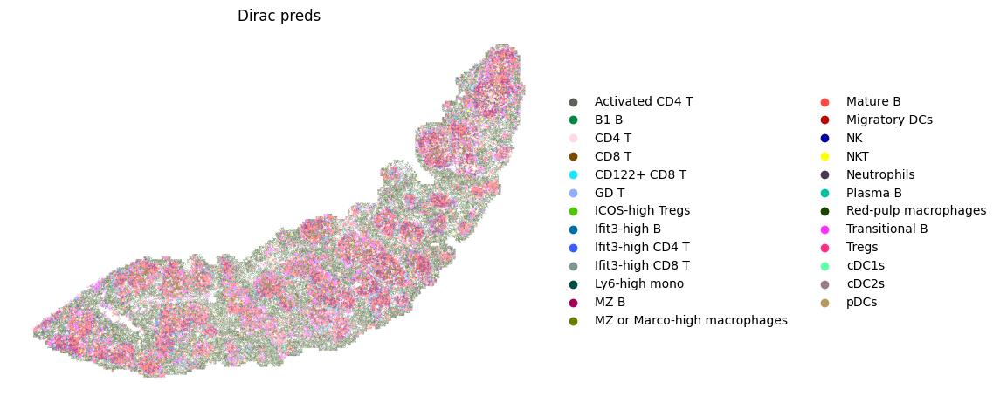

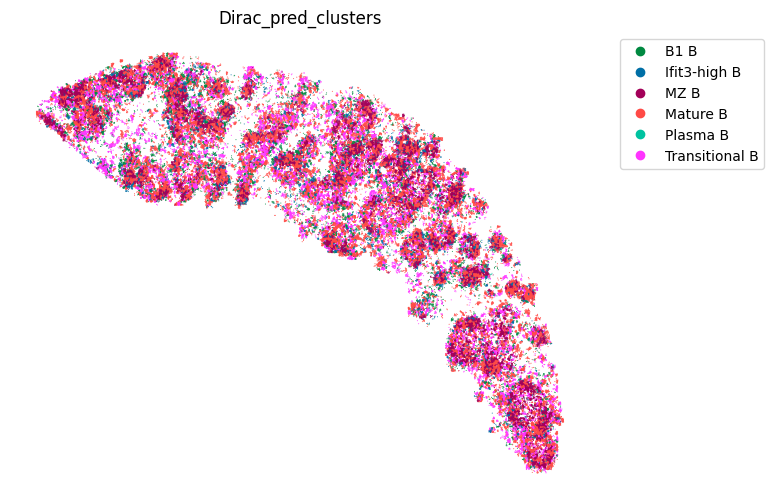

<Figure size 640x480 with 0 Axes>

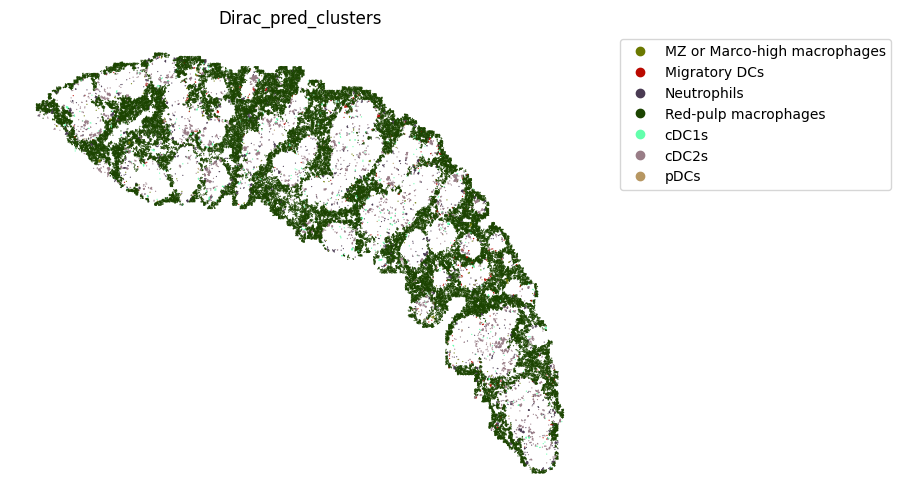

<Figure size 640x480 with 0 Axes>

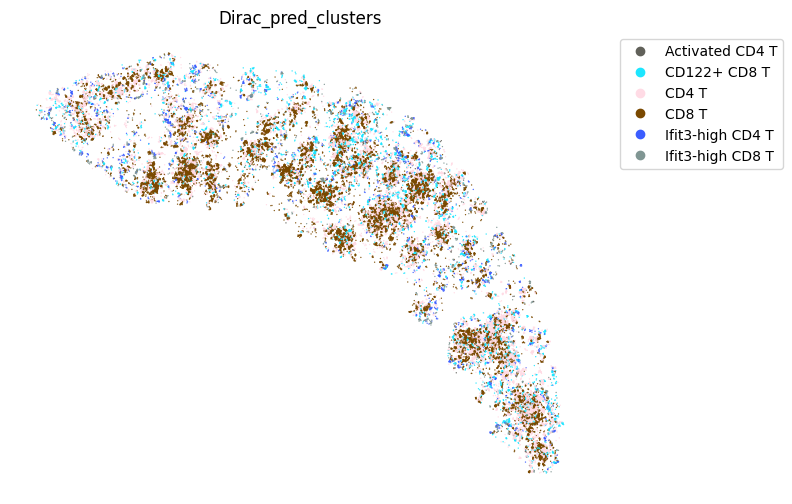

<Figure size 640x480 with 0 Axes>

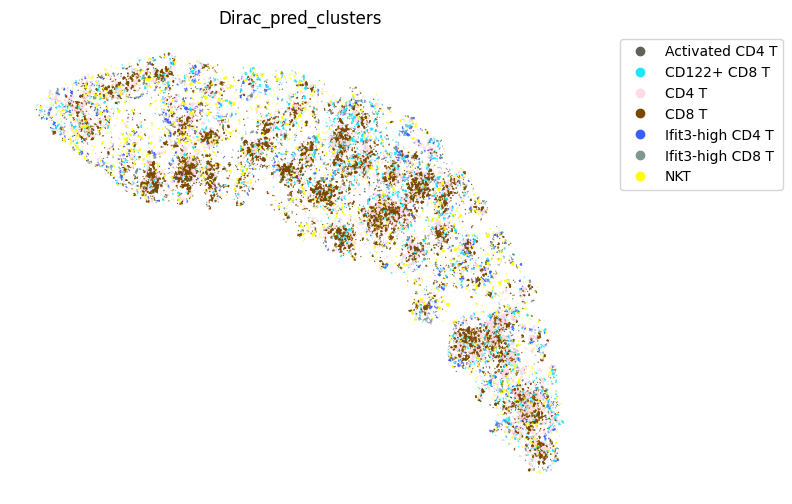

<Figure size 640x480 with 0 Axes>

In [20]:
source_adata_total.obsm[f"{methods}_embed"] = results["source_feat"]
target_adata_total.obsm[f"{methods}_embed"] = results["target_feat"]
target_adata_total.obs[f"{methods}_confs"] = results["target_confs"]
target_adata_total.obs[f"{methods}_pred_num"] = results["target_pred"]
target_adata_total.obs[f"{methods}_pred_clusters"] = target_adata_total.obs[f"{methods}_pred_num"].map(pairs)
print(Counter(target_adata_total.obs[f"{methods}_pred_clusters"]))

fig, ax = plt.subplots(figsize=(8, 6))

sc.pl.spatial(target_adata_total, 
              color=[f"{methods}_pred_clusters"], 
              frameon=False, 
              spot_size=15, 
              title=["Dirac preds"], 
              palette = colormaps_clusters,
              img_key = None,
              ax=ax)
fig.savefig(os.path.join(save_path, f"{data_name}_cell_type.pdf"), bbox_inches='tight', dpi = 300)


target_adata_total.uns['__type'] = "UMI"
fig, ax = plt.subplots(figsize=(8, 6))
st.pl.space(
    target_adata_total[target_adata_total.obs[f"{methods}_pred_clusters"].isin(['Transitional B', 'Mature B', 'Plasma B',
                                                                                'Ifit3-high B', 'B1 B', 'MZ B'])], #, 'Erythrocytes'
    space="spatial",
    color=["Dirac_pred_clusters"],
    alpha=0.9,
    figsize=(8, 8),
    show_legend="upper left",
    dpi=300, 
    pointsize=0.05,
    color_key = colormaps_clusters,
    ax=ax,
)
plt.tight_layout()
plt.show() 
fig.savefig(os.path.join(save_path, f"{data_name}_{methods}_B_spateo.png"), dpi = 600)


fig, ax = plt.subplots(figsize=(8, 6))
st.pl.space(
    target_adata_total[target_adata_total.obs[f"{methods}_pred_clusters"].isin(['Red-pulp macrophages', 'Migratory DCs', 'pDCs', 
                                                        'cDC1s', 'cDC2s','Neutrophils', 'MZ or Marco-high macrophages'])], #, 
    space="spatial",
    color=["Dirac_pred_clusters"],
    alpha=0.9,
    figsize=(8, 8),
    show_legend="upper left",
    dpi=300, 
    pointsize=0.05,
    color_key = colormaps_clusters,
    ax=ax,
)
plt.tight_layout()
plt.show() 
fig.savefig(os.path.join(save_path, f"{data_name}_{methods}_Red_pulp_spateo.png"), dpi = 600)


fig, ax = plt.subplots(figsize=(8, 6))
st.pl.space(
    target_adata_total[target_adata_total.obs[f"{methods}_pred_clusters"].isin(['Activated CD4 T', 'Ifit3-high CD4 T','CD4 T', 'CD8 T', 
                                                                                'CD122+ CD8 T', 'Ifit3-high CD8 T'])], #, 
    space="spatial",
    color=["Dirac_pred_clusters"],
    alpha=0.9,
    figsize=(8, 8),
    show_legend="upper left",
    dpi=300, 
    pointsize=0.05,
    color_key = colormaps_clusters,
    ax=ax,
)
plt.tight_layout()
plt.show() 
fig.savefig(os.path.join(save_path, f"{data_name}_{methods}_T_spateo.png"), dpi = 600)


fig, ax = plt.subplots(figsize=(8, 6))
st.pl.space(
    target_adata_total[target_adata_total.obs[f"{methods}_pred_clusters"].isin(['Activated CD4 T', 'Ifit3-high CD4 T','CD4 T', 'CD8 T', 
                                                                                'CD122+ CD8 T', 'Ifit3-high CD8 T', 'NKT'])], #, 
    space="spatial",
    color=["Dirac_pred_clusters"],
    alpha=0.9,
    figsize=(8, 8),
    show_legend="upper left",
    dpi=300, 
    pointsize=0.05,
    color_key = colormaps_clusters,
    ax=ax,
)
plt.tight_layout()
plt.show() 
fig.savefig(os.path.join(save_path, f"{data_name}_{methods}_T_NKT_spateo.png"), dpi = 600)

# plt.tight_layout()
# plt.show() 
# fig.savefig(os.path.join(save_path, f"{data_name}_{methods}_cell_type_B_spateo.png"), dpi = 600)

# for i in ["Red-pulp macrophages", 'Transitional B', 'Mature B', 'Migratory DCs', 'Erythrocytes']:
#     fig, ax = plt.subplots(figsize=(8, 6))
#     sc.pl.spatial(target_adata_total, 
#                   color=[f"{methods}_pred_clusters"], 
#                   groups=[i], 
#                   frameon=False, 
#                   spot_size=15, 
#                   title=["Dirac preds"], 
#                   palette = colormaps_clusters,
#                   img_key = None,
#                   ax=ax,
#                  )

# save_fig_path = os.path.join(save_path, "Single_cell_type")
# if not os.path.exists(save_fig_path):
#     os.makedirs(save_fig_path)

# for i in target_adata_total.obs[f"{methods}_pred_clusters"].unique():
#     fig, ax = plt.subplots(figsize=(8, 6))
#     sc.pl.spatial(target_adata_total, 
#                   color=[f"{methods}_pred_clusters"], 
#                   groups=[i], 
#                   frameon=False, 
#                   spot_size=15, 
#                   title=["Dirac preds"], 
#                   palette = colormaps_clusters,
#                   img_key = None,
#                   ax=ax,
#                  )
#     fig.savefig(os.path.join(save_fig_path, f"{data_name}_{i}.pdf"), bbox_inches='tight', dpi = 300)

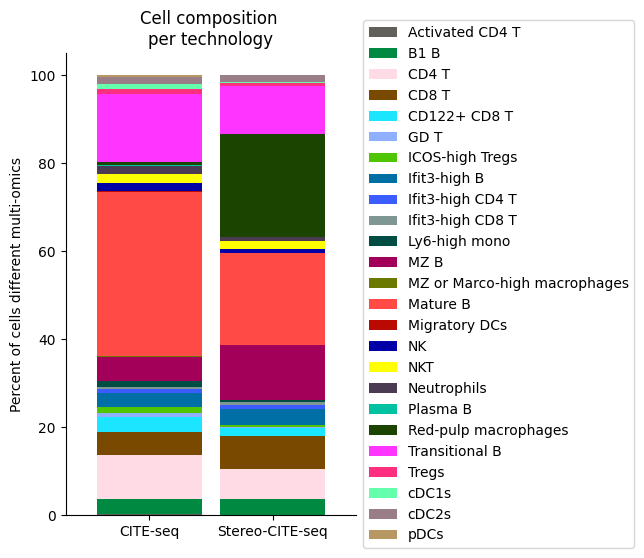

In [17]:
###########
# Use this ordering of cell types for consistency
import seaborn as sns

# Get cluster labels
source_spleen_clusters = pd.Series(source_adata_total.obs["cell_types"].values)
target_spleen_clusters = pd.Series(target_adata_total.obs["Dirac_pred_clusters"].values)

# Calculate cluster composition (cells as a percent of total in that tissue)
source_spleen_comp  = source_spleen_clusters.value_counts()/np.sum(source_spleen_clusters.value_counts())*100
target_spleen_comp = target_spleen_clusters.value_counts()/np.sum(target_spleen_clusters.value_counts())*100

# Make data frame of composition

composition_df = np.transpose(pd.DataFrame({"CITE-seq":source_spleen_comp, "Stereo-CITE-seq": target_spleen_comp}))
composition_df

# Plot tissue composition as stacked bar chart

fig, ax = plt.subplots(figsize=(3.75, 6)) # 5,8

composition_df.plot.bar(stacked = True, ax = ax, width = 0.85, color=colormaps_clusters),
plt.ylabel("Percent of cells different multi-omics")
plt.title("Cell composition \nper technology")
ax.legend(bbox_to_anchor = (1, 0.5), loc = "center left") # move legend to outside of plot
plt.xticks(rotation = 0)
sns.despine()

fig.savefig(os.path.join(save_path,"all_cell_composition_per_tissue.pdf"), dpi=300, bbox_inches='tight')

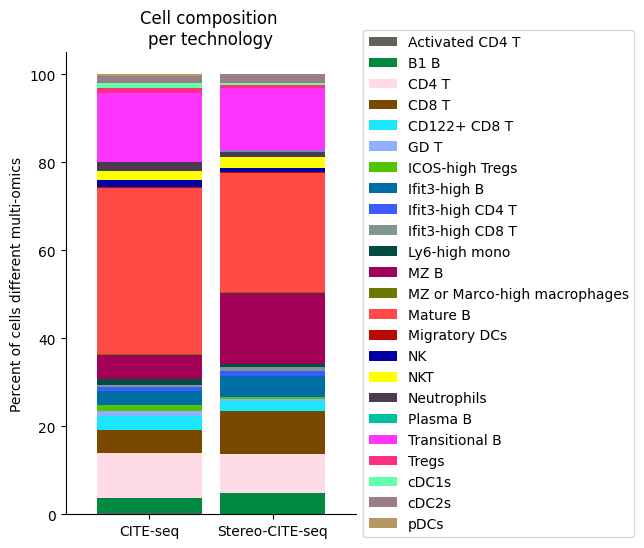

In [18]:
###########
# Use this ordering of cell types for consistency
import seaborn as sns


# Get cluster labels
source_spleen_clusters = pd.Series(source_adata_total[~source_adata_total.obs["cell_types"].isin(['Red-pulp macrophages'])].obs["cell_types"].values)
target_spleen_clusters = pd.Series(target_adata_total[~target_adata_total.obs["Dirac_pred_clusters"].isin(['Red-pulp macrophages'])].obs["Dirac_pred_clusters"].values)


# Calculate cluster composition (cells as a percent of total in that tissue)
source_spleen_comp  = source_spleen_clusters.value_counts()/np.sum(source_spleen_clusters.value_counts())*100
target_spleen_comp = target_spleen_clusters.value_counts()/np.sum(target_spleen_clusters.value_counts())*100

# Make data frame of composition

composition_df = np.transpose(pd.DataFrame({"CITE-seq":source_spleen_comp, "Stereo-CITE-seq": target_spleen_comp}))
composition_df

colormap_dict = {k: v for k, v in colormaps_clusters.items() if k != 'Red-pulp macrophages'}
# Plot tissue composition as stacked bar chart

fig, ax = plt.subplots(figsize=(3.75, 6)) # 5,8

composition_df.plot.bar(stacked = True, ax = ax, width = 0.85, color=colormap_dict),
plt.ylabel("Percent of cells different multi-omics")
plt.title("Cell composition \nper technology")
ax.legend(bbox_to_anchor = (1, 0.5), loc = "center left") # move legend to outside of plot
plt.xticks(rotation = 0)
sns.despine()

fig.savefig(os.path.join(save_path,"allcell_composition_per_tissue_delete_Red_pulp_macrophages.pdf"), dpi=300, bbox_inches='tight')

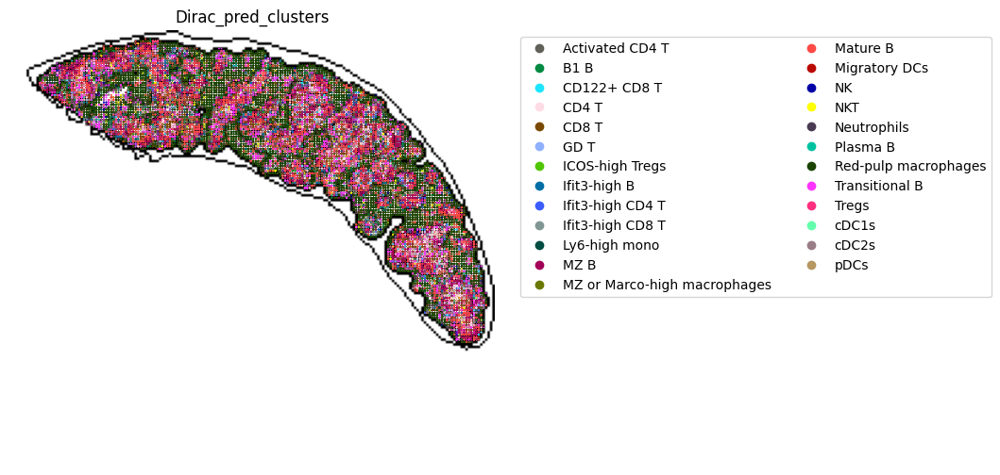

<Figure size 640x480 with 0 Axes>

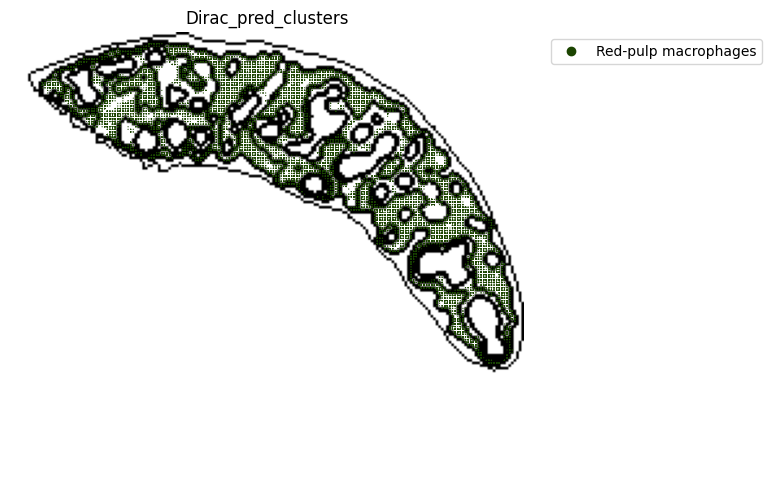

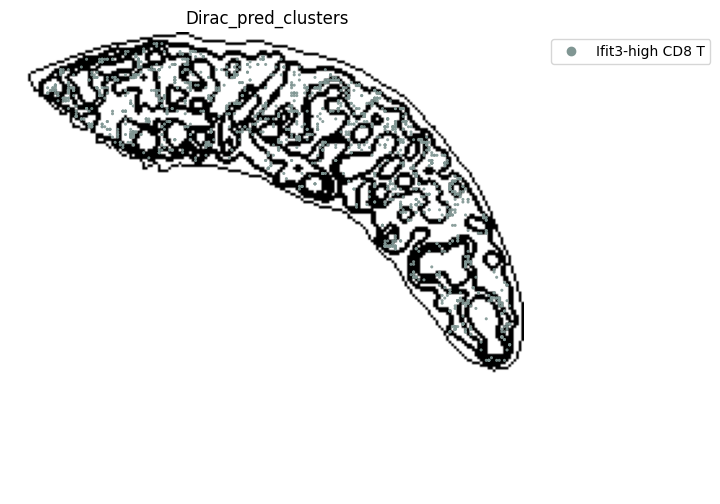

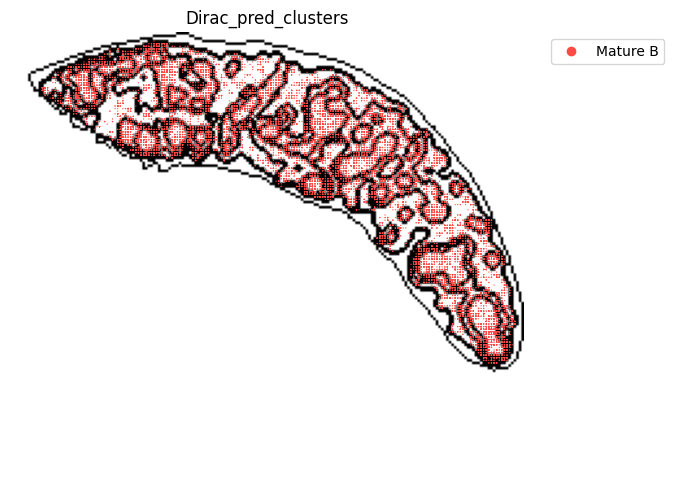

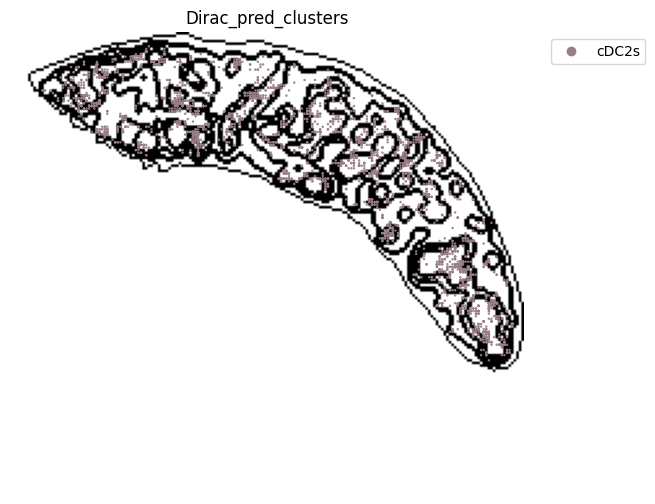

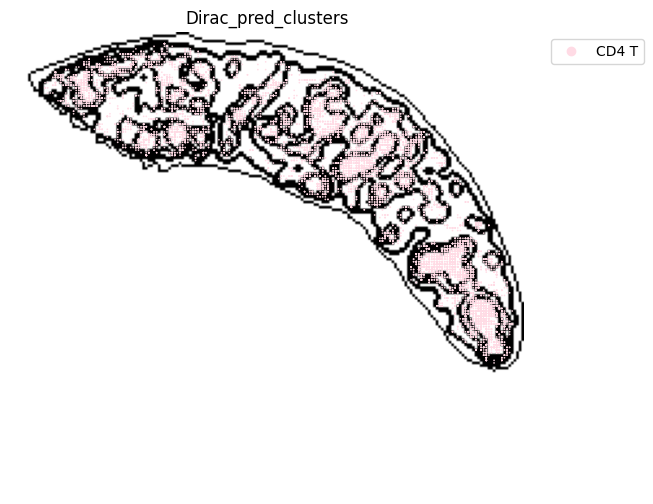

...

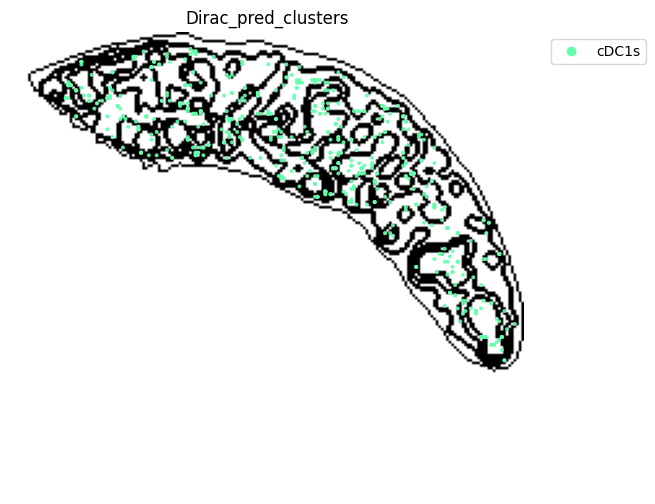

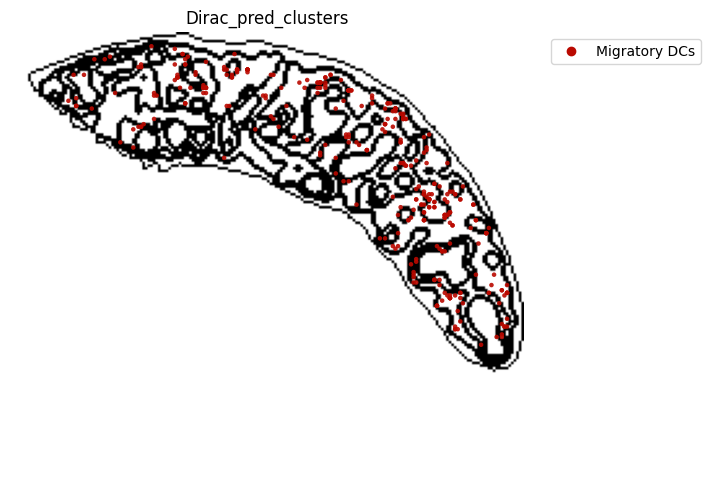

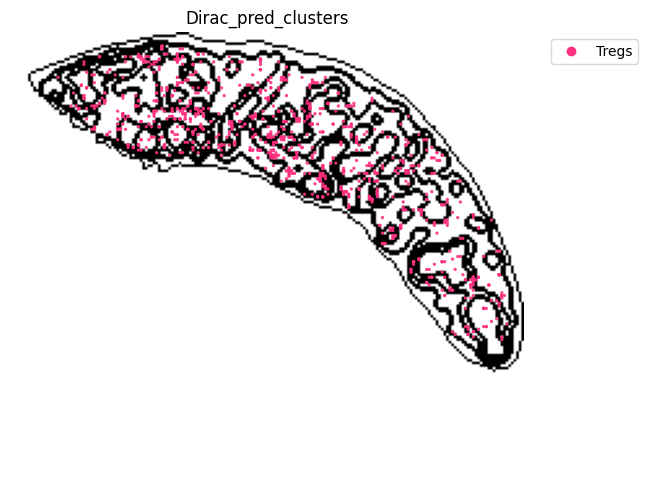

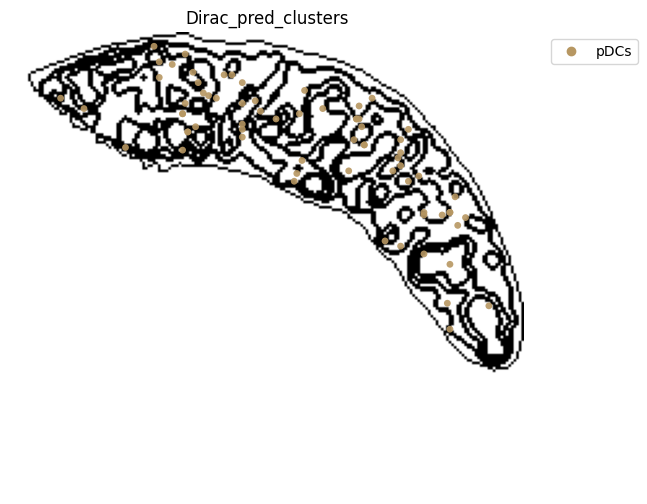

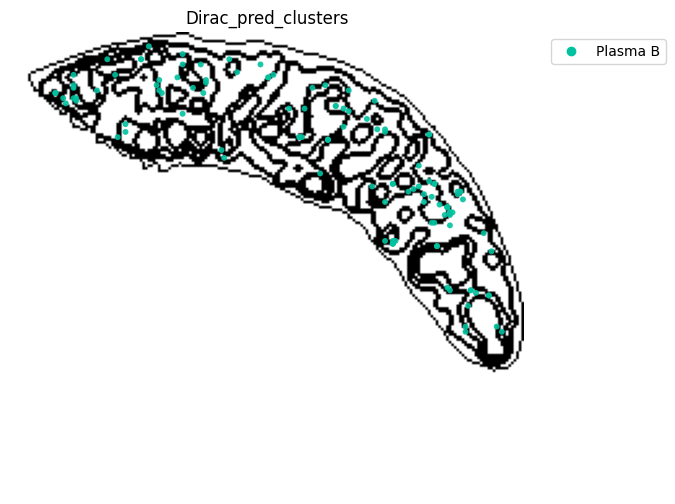

In [19]:
target_adata_total.obsm['spatial_bin100'] = target_adata_total.obsm['spatial'] // 100

target_adata_total = st.io.read_image(
    target_adata_total,
    filename=os.path.join("/home/project/11003054/changxu/Projects/SpaGNNs/Review/Re_2024_10_29/section5/Results/C03833D6_bin100_Dirac/20240925142432", "spatial_domains.png"),
    img_layer="layer1",
    slice="slice1",
    scale_factor=1,
)
target_adata_total.uns["__type"] = "UMI"

fig, ax = plt.subplots(figsize=(8, 6))
st.pl.space(
    target_adata_total,
    space="spatial_bin100",
    color=["Dirac_pred_clusters"],
    alpha=0.9,
    # figsize=(5, 3),
    show_legend="upper left",
    img_layers = "layer1",
    slices="slice1",
    # dpi=300, 
    pointsize=0.2,
    color_key = colormaps_clusters,
    ax=ax,
)
plt.tight_layout()
plt.show() 
fig.savefig(os.path.join(save_path, f"{data_name}_{methods}_cell_type_outlines.png"), dpi = 600)

save_fig_path = os.path.join(save_path, "Single_cell_type_outline")
if not os.path.exists(save_fig_path):
    os.makedirs(save_fig_path)

for i in target_adata_total.obs[f"{methods}_pred_clusters"].unique():
    fig, ax = plt.subplots(figsize=(8, 6))
    st.pl.space(
        target_adata_total[target_adata_total.obs[f"{methods}_pred_clusters"].isin([i])],
        space = "spatial_bin100",
        color = ["Dirac_pred_clusters"],
        alpha = 0.9,
        figsize = (5, 3),
        show_legend = "upper left",
        img_layers = "layer1",
        slices="slice1",
        dpi=300, 
        pointsize=0.05,
        color_key = colormaps_clusters,
        ax=ax)
    fig.savefig(os.path.join(save_fig_path, f"{data_name}_{i}.png"), dpi = 600)

# ######### 保存数据
target_adata_total.write(os.path.join(save_path, f"{data_name}_{methods}_{use_counts}_target.h5ad"), compression="gzip")
source_adata_total.write(os.path.join(save_path, f"{data_name}_{methods}_{use_counts}_source.h5ad"), compression="gzip")

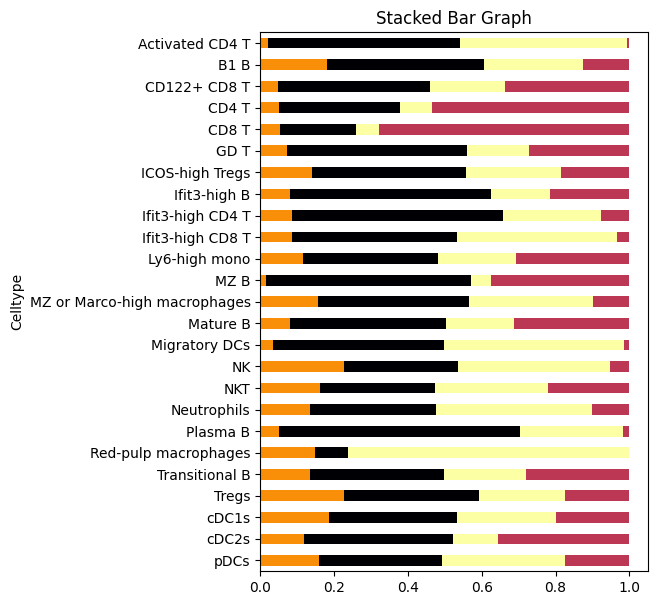

In [21]:
############## Perform some downstream analysis (bin=100)

# Define a mapping between tissue domains and their corresponding colors
bin100_cluster2colors = {
    "Marginal zone": '#000004ff',
    "Capsule": '#57106eff',
    "White pulp": '#bc3754ff',
    "Blood vessel": '#f98e09ff',
    "Red pulp": '#fcffa4ff',
}

# Initialize empty arrays to hold domain, cell type, and count information
domain_list = np.array([])
celltype_list = np.array([])
count_list = np.array([])

# Loop over the unique regions (domains) from the binning process and collect the cell type counts
for i in np.unique(target_adata_RNA.obs["region_domain_from_bin100"]):
    # Get the unique cell types and their counts for each domain
    tmp, counts = np.unique(target_adata_total[target_adata_RNA.obs["region_domain_from_bin100"] == i, :].obs[f"{methods}_pred_clusters"], return_counts=True)
    # Append the results to the lists for domains, cell types, and counts
    domain_list = np.append(domain_list, np.repeat(i, len(counts)))
    celltype_list = np.append(celltype_list, tmp)
    count_list = np.append(count_list, counts)

# Create a DataFrame with the summarized domain-celltype relationships
hetero_df = pd.DataFrame({"domain": domain_list, "celltype": celltype_list, "count": count_list.astype(int)})

# Show the first 10 rows of the DataFrame for inspection
hetero_df[0:10]

# Create a pivot table where the rows are cell types, columns are domains, and values are cell counts
spec_df_plt = hetero_df.pivot(index="celltype", columns="domain", values="count").fillna(0)

# Normalize the counts within each cell type (i.e., divide by the sum of each row)
spec_df_plt = spec_df_plt.div(spec_df_plt.sum(axis=1), axis=0)

# Add a new column for cell type labels and sort the DataFrame by cell type
spec_df_plt['Celltype'] = spec_df_plt.index
spec_df_plt.index = pd.CategoricalIndex(spec_df_plt.index, categories=spec_df_plt.index.astype(str).sort_values())
spec_df_plt = spec_df_plt.sort_index(ascending=False)

# Plot a stacked horizontal bar chart to show the cell distribution across domains
ax = spec_df_plt.plot(
    x='Celltype',  # Use cell types as the x-axis
    kind='barh',  # Horizontal bar chart
    stacked=True,  # Stack the bars to show proportions
    title='Stacked Bar Graph',  # Title of the plot
    mark_right=True,  # Mark the right end of the bars
    figsize=(5, 7),  # Set the figure size
    legend=False,  # Disable the legend for clarity
    color=bin100_cluster2colors,  # Use the color map defined earlier for domains
)

# Save the plot to a PDF file with high resolution
plt.savefig(os.path.join(save_path, f"{data_name}_bin100_celltype_distribution.pdf"), dpi=600)

# Display the plot
plt.show()

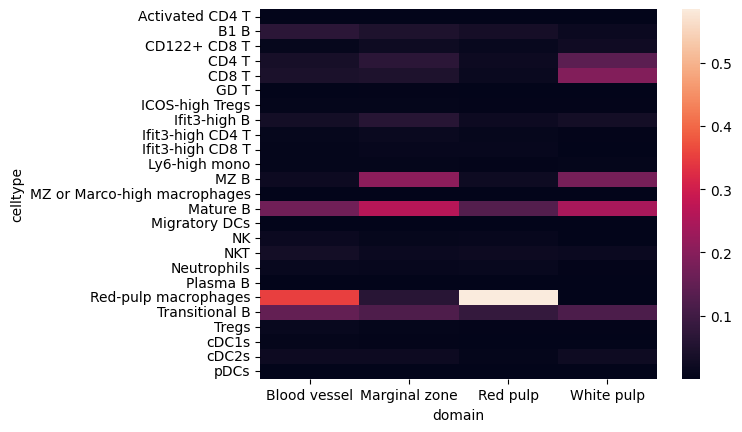

In [24]:
# Cell composition within each domain
import seaborn as sns
hetero_df_plt = hetero_df[hetero_df.domain!="NA"].pivot(index="domain", columns="celltype", values="count").fillna(0)
hetero_df_plt = hetero_df_plt.div(hetero_df_plt.sum(axis=1), axis=0)

ax = sns.heatmap(hetero_df_plt.T)
plt.savefig(os.path.join(save_path, f"{data_name}_bin100_celltype_heatmap.pdf"), dpi = 600)
plt.show()

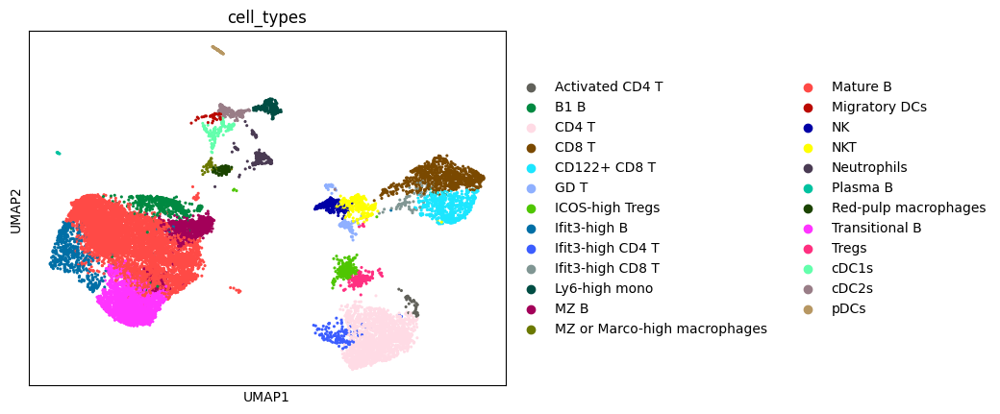

In [25]:
dp = sc.pl.umap(source_adata_RNA,color = "cell_types", palette = colormaps_clusters, size=20, return_fig=True)
dp.savefig(os.path.join(save_path, "cite_seq_annotation.pdf"), bbox_inches='tight', dpi = 300)

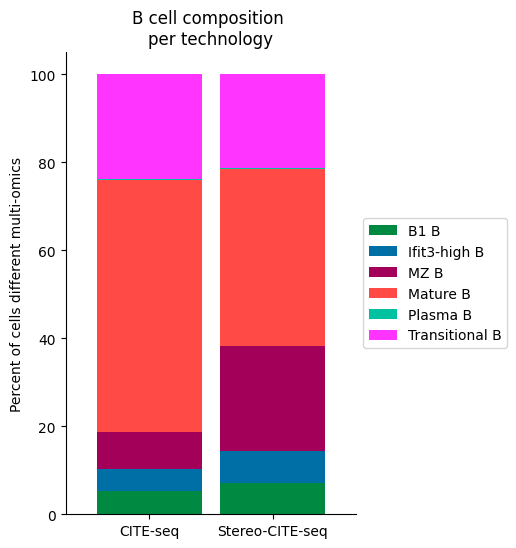

In [26]:
############
# Use this ordering of cell types for consistency
import seaborn as sns

Bcell_clust_onevall = ['Plasma B', 'Transitional B', 'Mature B', 'Ifit3-high B', 'B1 B', 'MZ B']

# Plot composition of spleen and lymph node B cell subsets as a stacked bar chart

# Calculate cluster composition of each tissue
# Get spleen/LN cells
source_spleen_B = source_adata_total[source_adata_total.obs["cell_types"].isin(Bcell_clust_onevall)]
target_spleen_B = target_adata_total[target_adata_total.obs["Dirac_pred_clusters"].isin(Bcell_clust_onevall)]


# Get cluster labels
source_spleen_clusters = pd.Series(source_spleen_B.obs["cell_types"].values)
target_spleen_clusters = pd.Series(target_spleen_B.obs["Dirac_pred_clusters"].values)

# Calculate cluster composition (cells as a percent of total in that tissue)
source_spleen_comp  = source_spleen_clusters.value_counts()/np.sum(source_spleen_clusters.value_counts())*100
target_spleen_comp = target_spleen_clusters.value_counts()/np.sum(target_spleen_clusters.value_counts())*100

# Make data frame of composition

composition_df = np.transpose(pd.DataFrame({"CITE-seq":source_spleen_comp, "Stereo-CITE-seq": target_spleen_comp}))
composition_df

# Plot tissue composition as stacked bar chart

fig, ax = plt.subplots(figsize=(3.75, 6)) # 5,8

composition_df.plot.bar(stacked = True, ax = ax, width = 0.85, color=colormaps_clusters),
plt.ylabel("Percent of cells different multi-omics")
plt.title("B cell composition \nper technology")
ax.legend(bbox_to_anchor = (1, 0.5), loc = "center left") # move legend to outside of plot
plt.xticks(rotation = 0)
sns.despine()

fig.savefig(os.path.join(save_path,"Bcell_composition_per_tissue.pdf"), dpi=300, bbox_inches='tight')

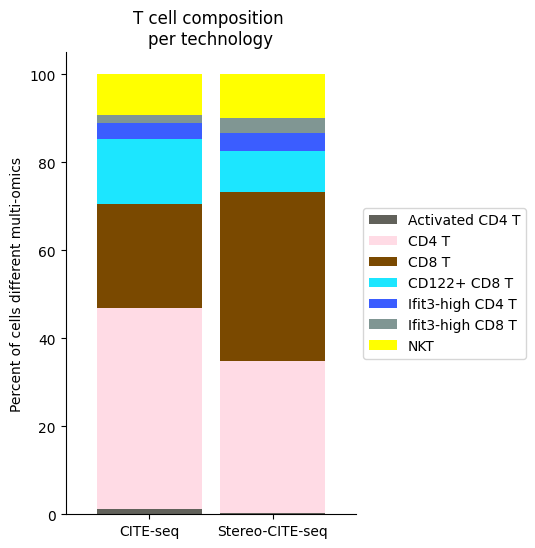

In [49]:
############
# Use this ordering of cell types for consistency
import seaborn as sns

Tcell_clust_onevall = ['Ifit3-high CD4 T','CD4 T', 'CD8 T', 'CD122+ CD8 T', 'Ifit3-high CD8 T', 'Activated CD4 T','NKT']

# Plot composition of spleen and lymph node B cell subsets as a stacked bar chart

# Calculate cluster composition of each tissue
# Get spleen/LN cells
source_spleen_T = source_adata_total[source_adata_total.obs["cell_types"].isin(Tcell_clust_onevall)]
target_spleen_T = target_adata_total[target_adata_total.obs["Dirac_pred_clusters"].isin(Tcell_clust_onevall)]


# Get cluster labels
source_spleen_clusters = pd.Series(source_spleen_T.obs["cell_types"].values)
target_spleen_clusters = pd.Series(target_spleen_T.obs["Dirac_pred_clusters"].values)

# Calculate cluster composition (cells as a percent of total in that tissue)
source_spleen_comp  = source_spleen_clusters.value_counts()/np.sum(source_spleen_clusters.value_counts())*100
target_spleen_comp = target_spleen_clusters.value_counts()/np.sum(target_spleen_clusters.value_counts())*100

# Make data frame of composition

composition_df = np.transpose(pd.DataFrame({"CITE-seq":source_spleen_comp, "Stereo-CITE-seq": target_spleen_comp}))
composition_df

# Plot tissue composition as stacked bar chart

fig, ax = plt.subplots(figsize=(3.75, 6)) # 5,8

composition_df.plot.bar(stacked = True, ax = ax, width = 0.85, color=colormaps_clusters),
plt.ylabel("Percent of cells different multi-omics")
plt.title("T cell composition \nper technology")
ax.legend(bbox_to_anchor = (1, 0.5), loc = "center left") # move legend to outside of plot
plt.xticks(rotation = 0)
sns.despine()

fig.savefig(os.path.join(save_path,"Tcell_composition_per_tissue.pdf"), dpi=300, bbox_inches='tight')

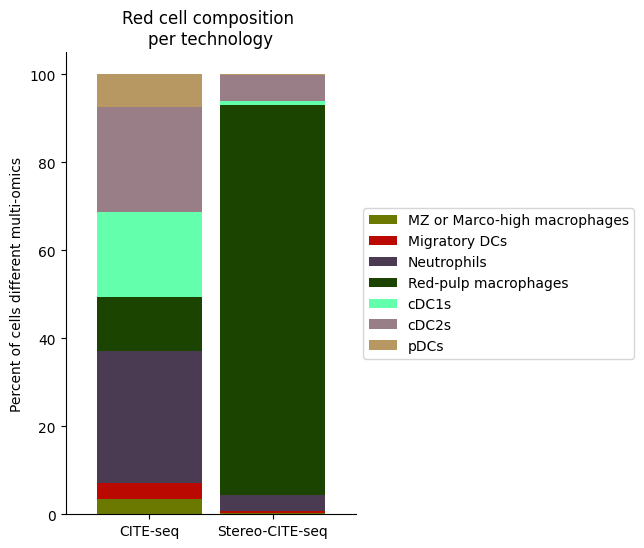

In [28]:
############
# Use this ordering of cell types for consistency
import seaborn as sns

Rcell_clust_onevall = ['Red-pulp macrophages', 'Migratory DCs', 'pDCs', 'cDC1s', 'cDC2s','Neutrophils', 'MZ or Marco-high macrophages']

# Plot composition of spleen and lymph node B cell subsets as a stacked bar chart

# Calculate cluster composition of each tissue
# Get spleen/LN cells
source_spleen_R = source_adata_total[source_adata_total.obs["cell_types"].isin(Rcell_clust_onevall)]
target_spleen_R = target_adata_total[target_adata_total.obs["Dirac_pred_clusters"].isin(Rcell_clust_onevall)]


# Get cluster labels
source_spleen_clusters = pd.Series(source_spleen_R.obs["cell_types"].values)
target_spleen_clusters = pd.Series(target_spleen_R.obs["Dirac_pred_clusters"].values)

# Calculate cluster composition (cells as a percent of total in that tissue)
source_spleen_comp  = source_spleen_clusters.value_counts()/np.sum(source_spleen_clusters.value_counts())*100
target_spleen_comp = target_spleen_clusters.value_counts()/np.sum(target_spleen_clusters.value_counts())*100

# Make data frame of composition

composition_df = np.transpose(pd.DataFrame({"CITE-seq":source_spleen_comp, "Stereo-CITE-seq": target_spleen_comp}))
composition_df

# Plot tissue composition as stacked bar chart

fig, ax = plt.subplots(figsize=(3.75, 6)) # 5,8

composition_df.plot.bar(stacked = True, ax = ax, width = 0.85, color=colormaps_clusters),
plt.ylabel("Percent of cells different multi-omics")
plt.title("Red cell composition \nper technology")
ax.legend(bbox_to_anchor = (1, 0.5), loc = "center left") # move legend to outside of plot
plt.xticks(rotation = 0)
sns.despine()

fig.savefig(os.path.join(save_path,"Rcell_composition_per_tissue.pdf"), dpi=300, bbox_inches='tight')

### Step 2.2: ADT only

In [47]:
########################################### Use only protein data for annotation

# Set the type of data to use for annotation (Protein in this case)
use_counts = "Protein"

# Find the common protein features between the source and target datasets
common_features = list(set(source_adata_protein.var_names) & set(target_adata_protein.var_names))

# Subset the source and target protein data to include only the common features
source_adata_protein = source_adata_protein[:, common_features].copy()
target_adata_protein = target_adata_protein[:, common_features].copy()

# Convert the categorical annotations into numerical codes for easier processing
source_adata_protein.obs[f"{use_obs_name}_num"] = source_adata_protein.obs[f"{use_obs_name}"].astype('category').cat.codes

###### Generate a color mapping for clusters (this can be used for visualizations)
# colormaps_clusters = dict(set(zip(source_adata_protein.obs[f"{use_obs_name}"].unique(), colormaps)))

# Define the path to save results and create the directory if it does not exist
save_path = os.path.join(results_path, f"{data_name}_{methods}_annotation", f"{now}", f"{use_counts}")
if not os.path.exists(save_path):
    os.makedirs(save_path)

# Assign the batch information to indicate which dataset each belongs to
source_adata_protein.obs["batch"] = "Source"
target_adata_protein.obs["batch"] = "Target"

# Create a dictionary mapping numerical codes to their corresponding labels
pairs = dict(set(zip(source_adata_protein.obs[f"{use_obs_name}_num"], source_adata_protein.obs[f"{use_obs_name}"])))

# Extract the labels and regions for the source and target data
source_label = source_adata_protein.obs[f"{use_obs_name}_num"].values
source_regions = source_adata_protein.obs["batch"].values
target_regions = target_adata_protein.obs["batch"].values

# Normalize the protein expression data for both source and target datasets
sc.pp.normalize_total(source_adata_protein, target_sum=1e4)
sc.pp.log1p(source_adata_protein)
sc.pp.scale(source_adata_protein)

sc.pp.normalize_total(target_adata_protein, target_sum=1e4)
sc.pp.log1p(target_adata_protein)
sc.pp.scale(target_adata_protein)

# Store the transformed (normalized, log-transformed, scaled) data in the 'X_HVG' slot for both source and target datasets
source_adata_protein.obsm["X_HVG"] = source_adata_protein.X
target_adata_protein.obsm["X_HVG"] = target_adata_protein.X

# Ensure the data is of type 'float32' for memory efficiency
source_adata_protein.obsm["X_HVG"] = source_adata_protein.obsm["X_HVG"].astype("float32")
target_adata_protein.obsm["X_HVG"] = target_adata_protein.obsm["X_HVG"].astype("float32")

In [48]:
source_edge_index = get_multi_edge_index(source_adata_protein.X.copy(), source_adata_protein.obs[f"{use_obs_name}"].copy().to_numpy(), n_neighbors = 15)
source_edge_index = torch.LongTensor(source_edge_index).T
target_adata_protein.obsm['spatial'] = target_adata_protein.obsm['spatial'].astype("float32")
target_edge_index = get_single_edge_index(target_adata_protein.obsm["spatial"].copy(), n_neighbors = 15)
target_edge_index = torch.LongTensor(target_edge_index).T

In [49]:
# Clear GPU memory
torch.cuda.empty_cache()
semisuper = annotate_app(save_path = save_path, use_gpu=True)
num_parts = 100
samples = semisuper._get_data(
                source_data = source_adata_protein.obsm["X_HVG"].copy(),
                source_label = source_label,
                source_edge_index = source_edge_index,
                target_data = target_adata_protein.obsm["X_HVG"].copy(),
                target_edge_index = target_edge_index,
                source_domain = np.zeros(source_adata_protein.shape[0]),
                target_domain = np.ones(target_adata_protein.shape[0]),
                num_parts_source = source_adata_total.shape[0] // 256,
                num_parts_target = target_adata_total.shape[0] // 1024,
                weighted_classes = False,)

models = semisuper._get_model(samples=samples, opt_GNN = "SAGE")
results = semisuper._train_dirac_annotate(samples=samples, models=models, n_epochs=50)
np.save(os.path.join(save_path, f"{data_name}_{methods}_Results.npy"), results)

Found 2 unique domains.


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!
Dirac annotate training..: 100%|█| 50/50 [00:56<00:00,  1.13s/it


Counter({'Mature B': 76111, 'Transitional B': 63136, 'MZ B': 26043, 'CD4 T': 21730, 'B1 B': 11247, 'CD8 T': 10882, 'Neutrophils': 9195, 'CD122+ CD8 T': 6871, 'NKT': 6342, 'Ly6-high mono': 3184, 'Tregs': 3014, 'cDC1s': 2564, 'cDC2s': 2434, 'GD T': 1162, 'NK': 1018, 'ICOS-high Tregs': 956, 'pDCs': 943, 'Red-pulp macrophages': 827, 'Activated CD4 T': 586, 'Ifit3-high CD8 T': 420, 'Ifit3-high B': 276, 'MZ or Marco-high macrophages': 183, 'Plasma B': 174, 'Migratory DCs': 116, 'Ifit3-high CD4 T': 38})


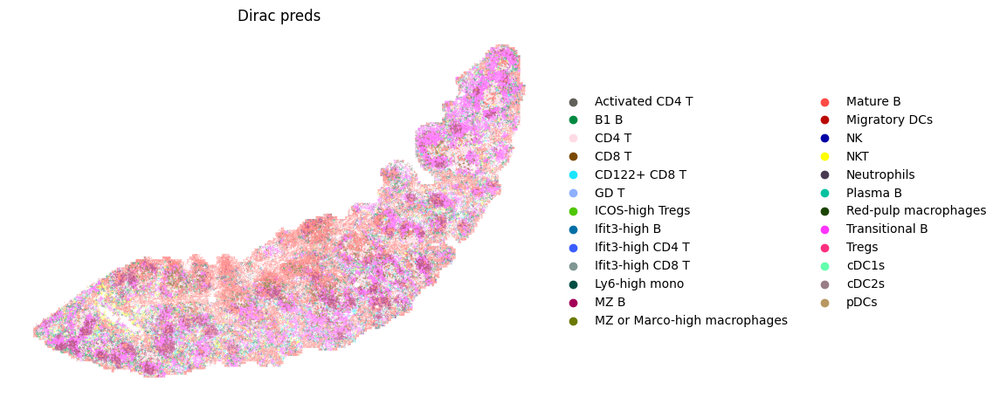

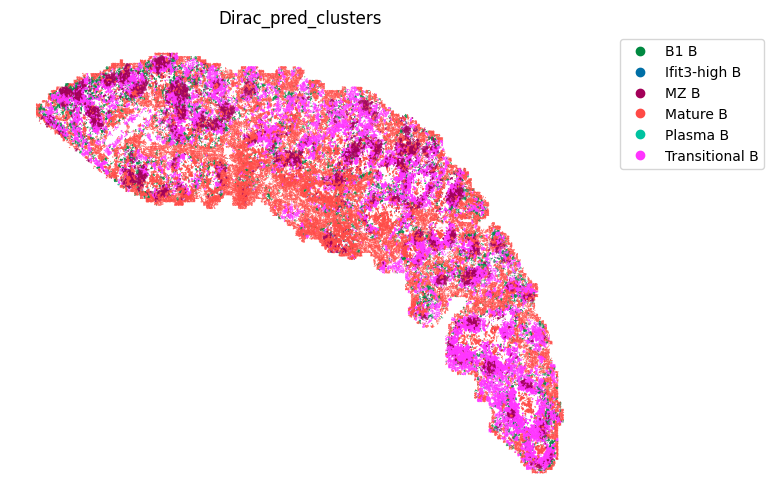

<Figure size 640x480 with 0 Axes>

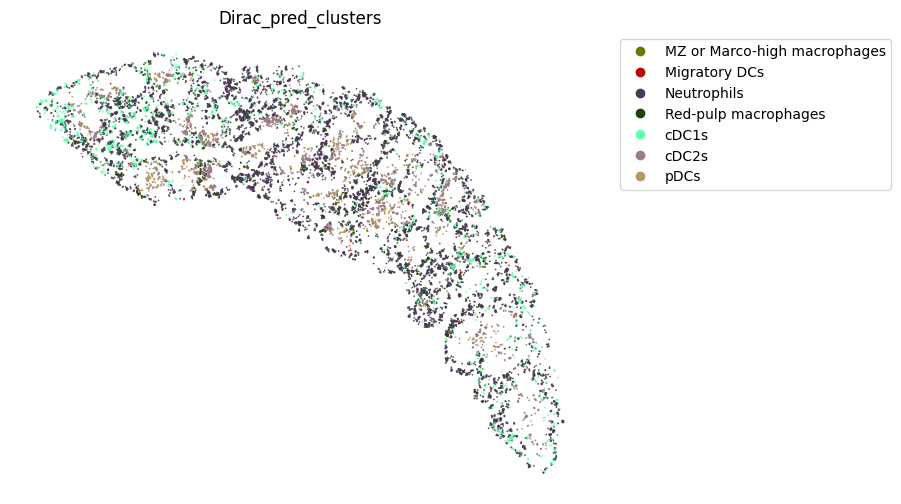

<Figure size 640x480 with 0 Axes>

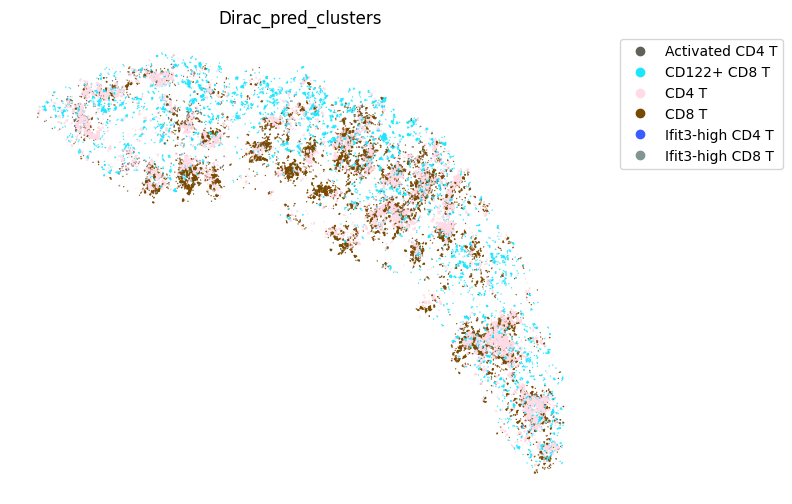

<Figure size 640x480 with 0 Axes>

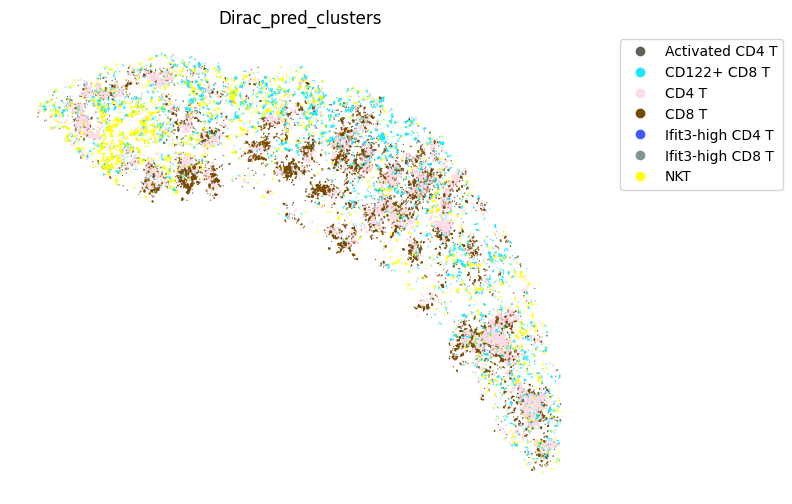

<Figure size 640x480 with 0 Axes>

In [51]:
source_adata_protein.obsm[f"{methods}_embed"] = results["source_feat"]
target_adata_protein.obsm[f"{methods}_embed"] = results["target_feat"]
target_adata_protein.obs[f"{methods}_confs"] = results["target_confs"]
target_adata_protein.obs[f"{methods}_pred_num"] = results["target_pred"]
target_adata_protein.obs[f"{methods}_pred_clusters"] = target_adata_protein.obs[f"{methods}_pred_num"].map(pairs)
print(Counter(target_adata_protein.obs[f"{methods}_pred_clusters"]))


fig, ax = plt.subplots(figsize=(8, 6))

sc.pl.spatial(target_adata_protein, 
              color=[f"{methods}_pred_clusters"], 
              frameon=False, 
              spot_size=15, 
              title=["Dirac preds"], 
              palette = colormaps_clusters,
                img_key = None,
              ax=ax)
fig.savefig(os.path.join(save_path, f"{data_name}_cell_type.pdf"), bbox_inches='tight', dpi = 300)

target_adata_protein.uns['__type'] = "UMI"
fig, ax = plt.subplots(figsize=(8, 6))
st.pl.space(
    target_adata_protein[target_adata_protein.obs[f"{methods}_pred_clusters"].isin(['Transitional B', 'Mature B', 'Plasma B',
                                                                                'Ifit3-high B', 'B1 B', 'MZ B'])], #, 'Erythrocytes'
    space="spatial",
    color=["Dirac_pred_clusters"],
    alpha=0.9,
    figsize=(8, 8),
    show_legend="upper left",
    dpi=300, 
    pointsize=0.05,
    color_key = colormaps_clusters,
    ax=ax,
)
plt.tight_layout()
plt.show() 
fig.savefig(os.path.join(save_path, f"{data_name}_{methods}_B_spateo.png"), dpi = 600)


fig, ax = plt.subplots(figsize=(8, 6))
st.pl.space(
    target_adata_protein[target_adata_protein.obs[f"{methods}_pred_clusters"].isin(['Red-pulp macrophages', 'Migratory DCs', 'pDCs', 
                                                        'cDC1s', 'cDC2s','Neutrophils', 'MZ or Marco-high macrophages'])], #, 
    space="spatial",
    color=["Dirac_pred_clusters"],
    alpha=0.9,
    figsize=(8, 8),
    show_legend="upper left",
    dpi=300, 
    pointsize=0.05,
    color_key = colormaps_clusters,
    ax=ax,
)
plt.tight_layout()
plt.show() 
fig.savefig(os.path.join(save_path, f"{data_name}_{methods}_Red_pulp_spateo.png"), dpi = 600)


fig, ax = plt.subplots(figsize=(8, 6))
st.pl.space(
    target_adata_protein[target_adata_protein.obs[f"{methods}_pred_clusters"].isin(['Activated CD4 T', 'Ifit3-high CD4 T','CD4 T', 'CD8 T', 
                                                                                'CD122+ CD8 T', 'Ifit3-high CD8 T'])], #, 
    space="spatial",
    color=["Dirac_pred_clusters"],
    alpha=0.9,
    figsize=(8, 8),
    show_legend="upper left",
    dpi=300, 
    pointsize=0.05,
    color_key = colormaps_clusters,
    ax=ax,
)
plt.tight_layout()
plt.show() 
fig.savefig(os.path.join(save_path, f"{data_name}_{methods}_T_spateo.png"), dpi = 600)


fig, ax = plt.subplots(figsize=(8, 6))
st.pl.space(
    target_adata_protein[target_adata_protein.obs[f"{methods}_pred_clusters"].isin(['Activated CD4 T', 'Ifit3-high CD4 T','CD4 T', 'CD8 T', 
                                                                                'CD122+ CD8 T', 'Ifit3-high CD8 T', 'NKT'])], #, 
    space="spatial",
    color=["Dirac_pred_clusters"],
    alpha=0.9,
    figsize=(8, 8),
    show_legend="upper left",
    dpi=300, 
    pointsize=0.05,
    color_key = colormaps_clusters,
    ax=ax,
)
plt.tight_layout()
plt.show() 
fig.savefig(os.path.join(save_path, f"{data_name}_{methods}_T_NKT_spateo.png"), dpi = 600)

# save_fig_path = os.path.join(save_path, "Single_cell_type")
# if not os.path.exists(save_fig_path):
#     os.makedirs(save_fig_path)

# for i in target_adata_protein.obs[f"{methods}_pred_clusters"].unique():
#     fig, ax = plt.subplots(figsize=(8, 6))
#     sc.pl.spatial(target_adata_protein, 
#                   color=[f"{methods}_pred_clusters"], 
#                   groups=[i], 
#                   frameon=False, 
#                   spot_size=15, 
#                   title=["Dirac preds"], 
#                   palette = colormaps_clusters,
#                   ax=ax,
#                  )
#     fig.savefig(os.path.join(save_fig_path, f"{data_name}_{i}.pdf"), bbox_inches='tight', dpi = 300)

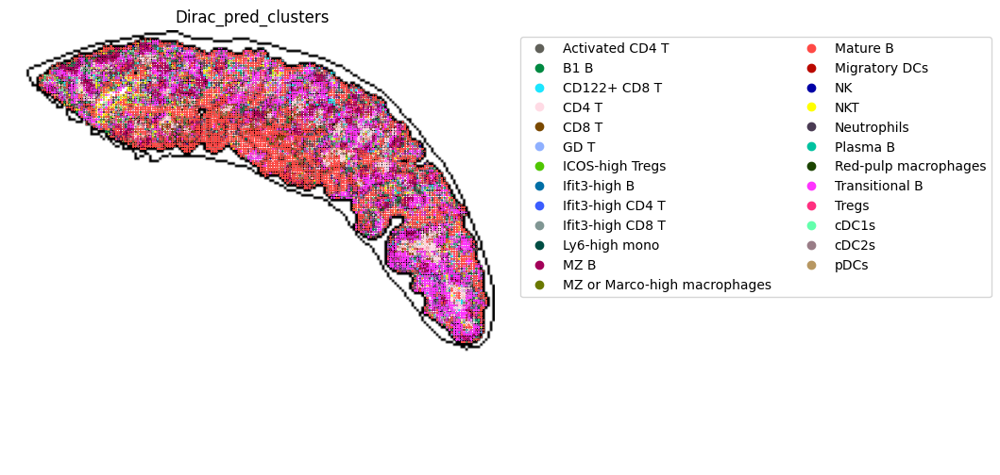

<Figure size 640x480 with 0 Axes>

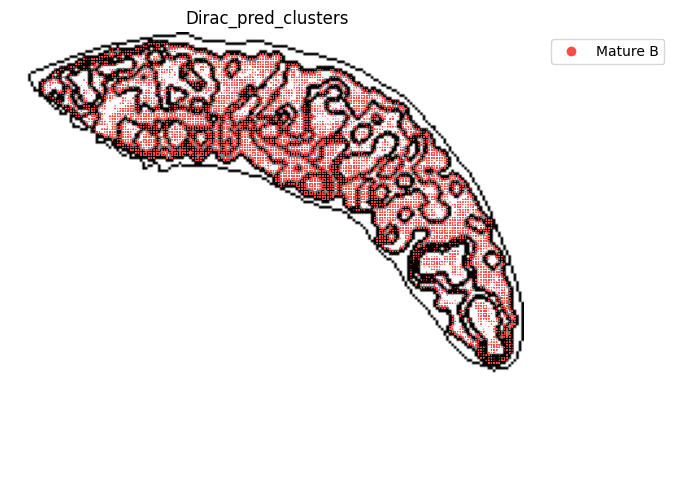

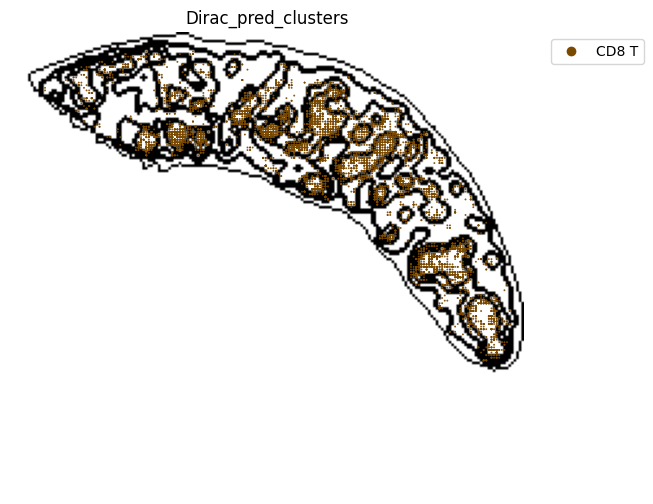

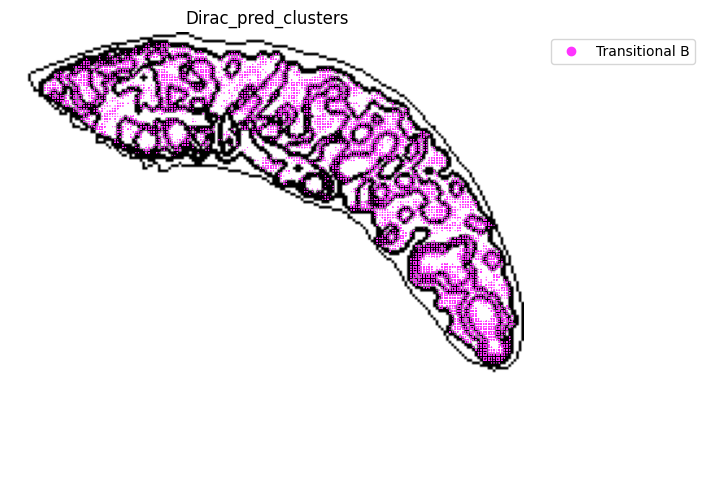

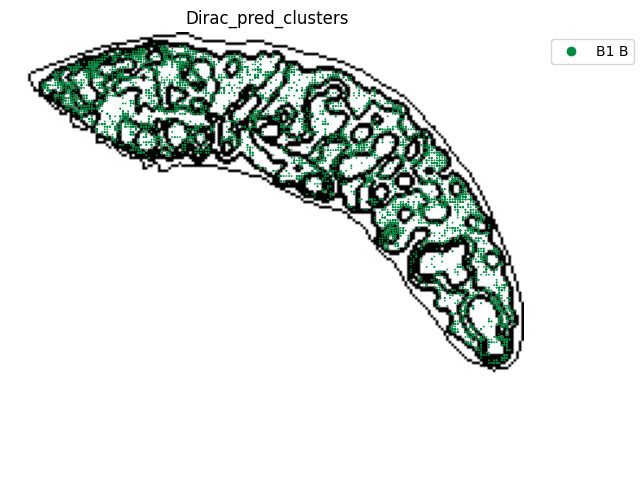

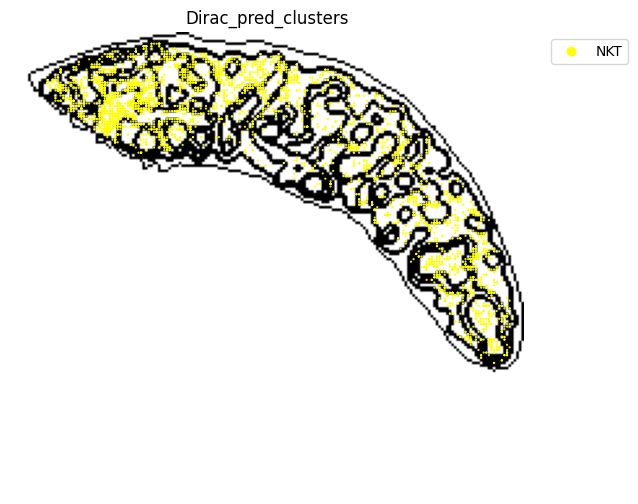

...

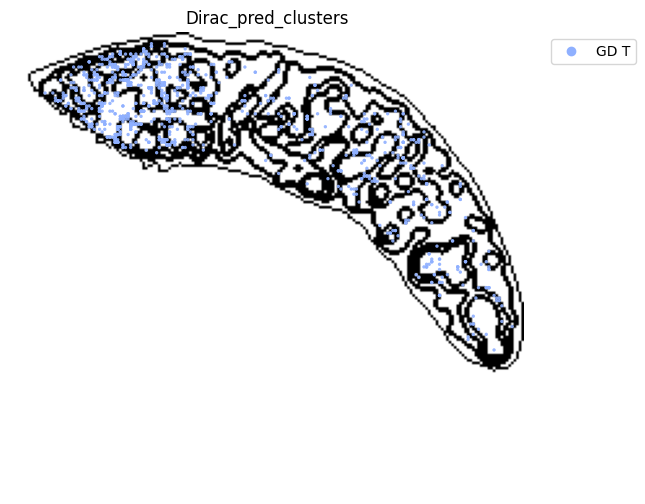

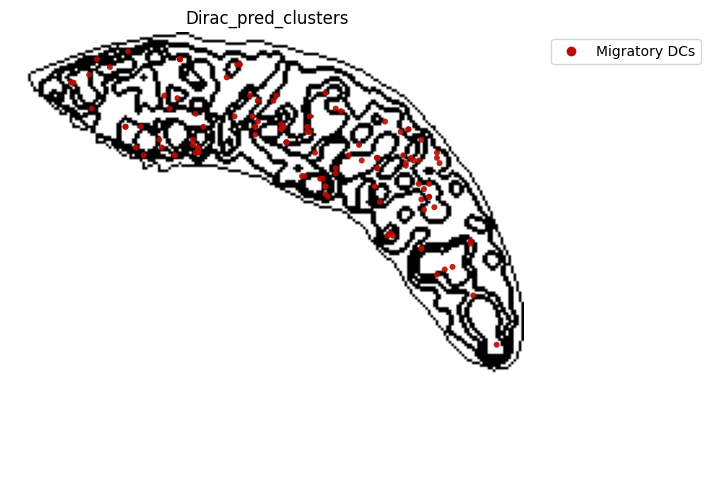

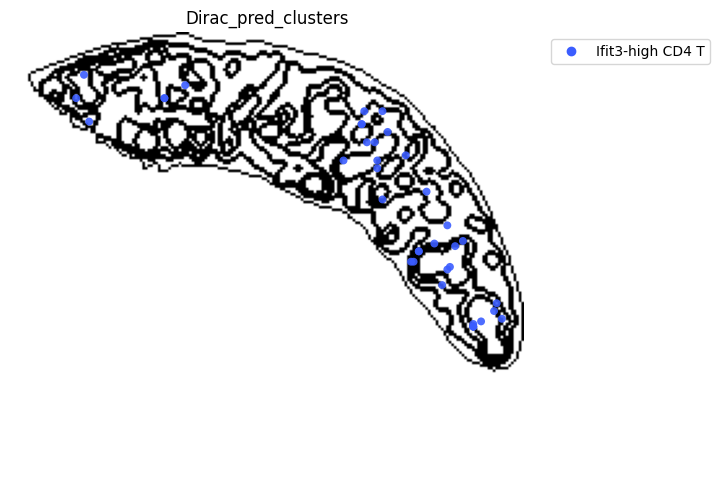

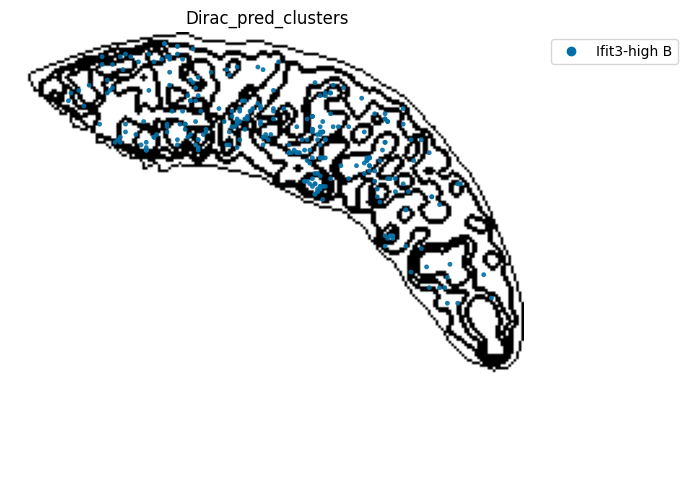

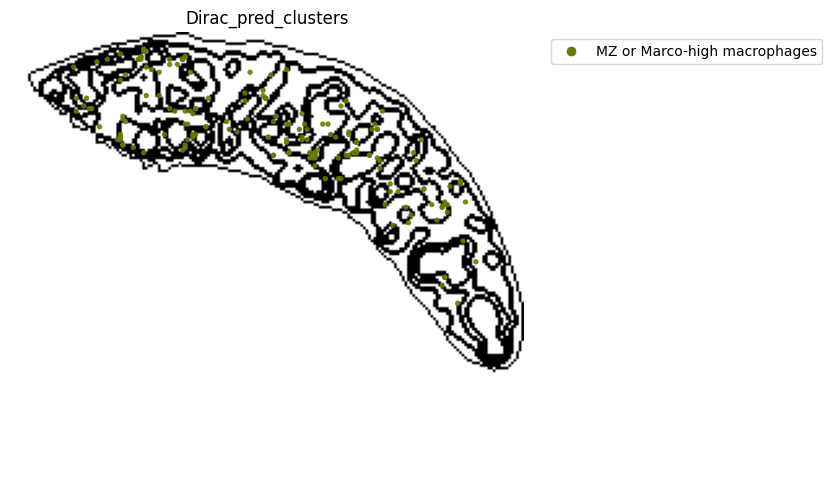

In [52]:
target_adata_protein.obsm['spatial_bin100'] = target_adata_protein.obsm['spatial'] // 100

target_adata_protein = st.io.read_image(
    target_adata_protein,
    filename=os.path.join("/home/project/11003054/changxu/Projects/SpaGNNs/Review/Re_2024_10_29/section5/Results/C03833D6_bin100_Dirac/20240925142432", "spatial_domains.png"),
    img_layer="layer1",
    slice="slice1",
    scale_factor=1,
)

target_adata_protein.uns["__type"] = "UMI"

fig, ax = plt.subplots(figsize=(8, 6))
st.pl.space(
    target_adata_protein,
    space="spatial_bin100",
    color=["Dirac_pred_clusters"],
    alpha=0.9,
    figsize=(5, 3),
    show_legend="upper left",
    img_layers = "layer1",
    slices="slice1",
    dpi=300, 
    pointsize=0.2,
    color_key = colormaps_clusters,
    ax=ax,
)
plt.tight_layout()
plt.show() 
fig.savefig(os.path.join(save_path, f"{data_name}_{methods}_cell_type_outlines.png"), dpi = 600)



save_fig_path = os.path.join(save_path, "Single_cell_type_outline")
if not os.path.exists(save_fig_path):
    os.makedirs(save_fig_path)

for i in target_adata_protein.obs[f"{methods}_pred_clusters"].unique():
    fig, ax = plt.subplots(figsize=(8, 6))
    st.pl.space(
        target_adata_protein[target_adata_protein.obs[f"{methods}_pred_clusters"].isin([i])],
        space = "spatial_bin100",
        color = ["Dirac_pred_clusters"],
        alpha = 0.9,
        figsize = (5, 3),
        show_legend = "upper left",
        img_layers = "layer1",
        slices="slice1",
        dpi=300, 
        pointsize=0.05,
        color_key = colormaps_clusters,
        ax=ax)
    fig.savefig(os.path.join(save_fig_path, f"{data_name}_{i}.png"), dpi = 600)

######### save data
target_adata_protein.write(os.path.join(save_path, f"{data_name}_{methods}_{use_counts}_target.h5ad"), compression="gzip")
source_adata_protein.write(os.path.join(save_path, f"{data_name}_{methods}_{use_counts}_source.h5ad"), compression="gzip")

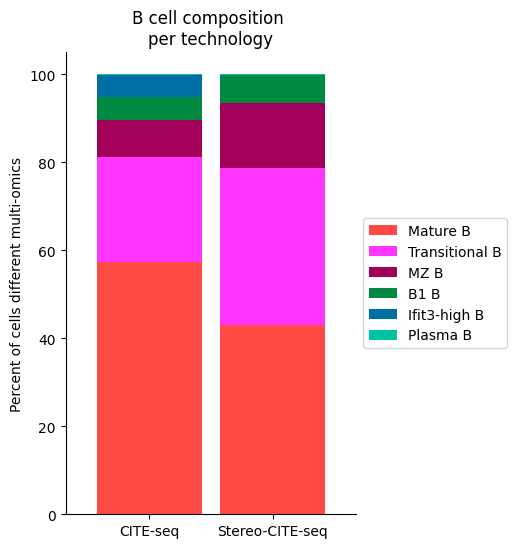

In [53]:
############
# Use this ordering of cell types for consistency
import seaborn as sns

Bcell_clust_onevall = ['Plasma B', 'Transitional B', 'Mature B', 'Ifit3-high B', 'B1 B', 'MZ B']

# Plot composition of spleen and lymph node B cell subsets as a stacked bar chart

# Calculate cluster composition of each tissue
# Get spleen/LN cells
source_spleen_B = source_adata_protein[source_adata_protein.obs["cell_types"].isin(Bcell_clust_onevall)]
target_spleen_B = target_adata_protein[target_adata_protein.obs["Dirac_pred_clusters"].isin(Bcell_clust_onevall)]


# Get cluster labels
source_spleen_clusters = pd.Series(source_spleen_B.obs["cell_types"].values)
target_spleen_clusters = pd.Series(target_spleen_B.obs["Dirac_pred_clusters"].values)

# Calculate cluster composition (cells as a percent of total in that tissue)
source_spleen_comp  = source_spleen_clusters.value_counts()/np.sum(source_spleen_clusters.value_counts())*100
target_spleen_comp = target_spleen_clusters.value_counts()/np.sum(target_spleen_clusters.value_counts())*100

# Make data frame of composition

composition_df = np.transpose(pd.DataFrame({"CITE-seq":source_spleen_comp, "Stereo-CITE-seq": target_spleen_comp}))
composition_df

# Plot tissue composition as stacked bar chart

fig, ax = plt.subplots(figsize=(3.75, 6)) # 5,8

composition_df.plot.bar(stacked = True, ax = ax, width = 0.85, color=colormaps_clusters),
plt.ylabel("Percent of cells different multi-omics")
plt.title("B cell composition \nper technology")
ax.legend(bbox_to_anchor = (1, 0.5), loc = "center left") # move legend to outside of plot
plt.xticks(rotation = 0)
sns.despine()

fig.savefig(os.path.join(save_path,"Bcell_composition_per_tissue.pdf"), dpi=300, bbox_inches='tight')

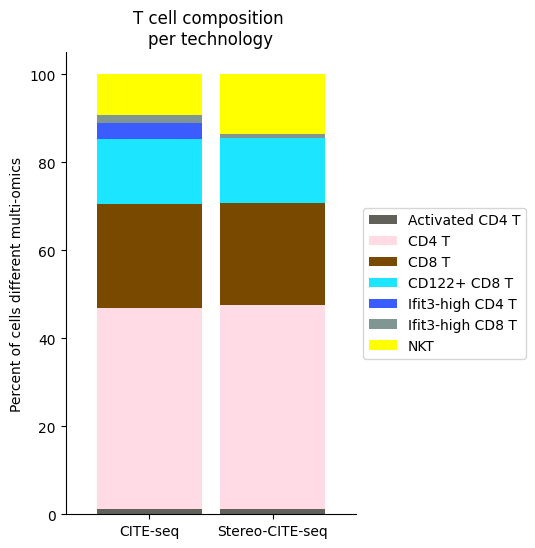

In [54]:
############
# Use this ordering of cell types for consistency
import seaborn as sns

Tcell_clust_onevall = ['Ifit3-high CD4 T','CD4 T', 'CD8 T', 'CD122+ CD8 T', 'Ifit3-high CD8 T', 'Activated CD4 T','NKT']

# Plot composition of spleen and lymph node B cell subsets as a stacked bar chart

# Calculate cluster composition of each tissue
# Get spleen/LN cells
source_spleen_T = source_adata_protein[source_adata_protein.obs["cell_types"].isin(Tcell_clust_onevall)]
target_spleen_T = target_adata_protein[target_adata_protein.obs["Dirac_pred_clusters"].isin(Tcell_clust_onevall)]


# Get cluster labels
source_spleen_clusters = pd.Series(source_spleen_T.obs["cell_types"].values)
target_spleen_clusters = pd.Series(target_spleen_T.obs["Dirac_pred_clusters"].values)

# Calculate cluster composition (cells as a percent of total in that tissue)
source_spleen_comp  = source_spleen_clusters.value_counts()/np.sum(source_spleen_clusters.value_counts())*100
target_spleen_comp = target_spleen_clusters.value_counts()/np.sum(target_spleen_clusters.value_counts())*100

# Make data frame of composition

composition_df = np.transpose(pd.DataFrame({"CITE-seq":source_spleen_comp, "Stereo-CITE-seq": target_spleen_comp}))
composition_df

# Plot tissue composition as stacked bar chart

fig, ax = plt.subplots(figsize=(3.75, 6)) # 5,8

composition_df.plot.bar(stacked = True, ax = ax, width = 0.85, color=colormaps_clusters),
plt.ylabel("Percent of cells different multi-omics")
plt.title("T cell composition \nper technology")
ax.legend(bbox_to_anchor = (1, 0.5), loc = "center left") # move legend to outside of plot
plt.xticks(rotation = 0)
sns.despine()

fig.savefig(os.path.join(save_path,"Tcell_composition_per_tissue.pdf"), dpi=300, bbox_inches='tight')

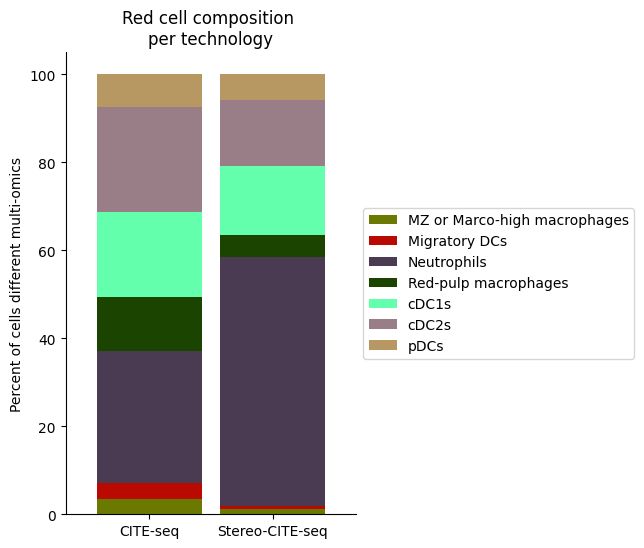

In [55]:
############
# Use this ordering of cell types for consistency
import seaborn as sns

Rcell_clust_onevall = ['Red-pulp macrophages', 'Migratory DCs', 'pDCs', 'cDC1s', 'cDC2s','Neutrophils', 'MZ or Marco-high macrophages']

# Plot composition of spleen and lymph node B cell subsets as a stacked bar chart

# Calculate cluster composition of each tissue
# Get spleen/LN cells
source_spleen_R = source_adata_protein[source_adata_protein.obs["cell_types"].isin(Rcell_clust_onevall)]
target_spleen_R = target_adata_protein[target_adata_protein.obs["Dirac_pred_clusters"].isin(Rcell_clust_onevall)]


# Get cluster labels
source_spleen_clusters = pd.Series(source_spleen_R.obs["cell_types"].values)
target_spleen_clusters = pd.Series(target_spleen_R.obs["Dirac_pred_clusters"].values)

# Calculate cluster composition (cells as a percent of total in that tissue)
source_spleen_comp  = source_spleen_clusters.value_counts()/np.sum(source_spleen_clusters.value_counts())*100
target_spleen_comp = target_spleen_clusters.value_counts()/np.sum(target_spleen_clusters.value_counts())*100

# Make data frame of composition

composition_df = np.transpose(pd.DataFrame({"CITE-seq":source_spleen_comp, "Stereo-CITE-seq": target_spleen_comp}))
composition_df

# Plot tissue composition as stacked bar chart

fig, ax = plt.subplots(figsize=(3.75, 6)) # 5,8

composition_df.plot.bar(stacked = True, ax = ax, width = 0.85, color=colormaps_clusters),
plt.ylabel("Percent of cells different multi-omics")
plt.title("Red cell composition \nper technology")
ax.legend(bbox_to_anchor = (1, 0.5), loc = "center left") # move legend to outside of plot
plt.xticks(rotation = 0)
sns.despine()

fig.savefig(os.path.join(save_path,"Rcell_composition_per_tissue.pdf"), dpi=300, bbox_inches='tight')

### Step 2.3: Only RNA

In [52]:
############## Train using RNA and Differential Genes

# Set the type of data to use for annotation (RNA in this case)
use_counts = "RNA"

# Find the common genes between the source and target datasets
common_genes = list(set(source_adata_RNA.var_names) & set(target_adata_RNA.var_names))

# Subset the source and target RNA data to include only the common genes
source_adata_RNA = source_adata_RNA[:, common_genes].copy()
target_adata_RNA = target_adata_RNA[:, common_genes].copy()

# Convert the categorical annotations into numerical codes for easier processing
source_adata_RNA.obs[f"{use_obs_name}_num"] = source_adata_RNA.obs[f"{use_obs_name}"].astype('category').cat.codes

###### Generate a color mapping for clusters (this can be used for visualizations)
# colormaps_clusters = dict(set(zip(source_adata_RNA.obs[f"{use_obs_name}"].unique(), colormaps)))

# Define the path to save results and create the directory if it does not exist
save_path = os.path.join(results_path, f"{data_name}_{methods}_annotation", f"{now}", f"{use_counts}")
if not os.path.exists(save_path):
    os.makedirs(save_path)

# Assign the batch information to indicate which dataset each belongs to (Source for RNA dataset and Target for target dataset)
source_adata_RNA.obs["batch"] = "Source"
target_adata_RNA.obs["batch"] = "Target"

# Create a dictionary mapping numerical codes to their corresponding labels for source annotations
pairs = dict(set(zip(source_adata_RNA.obs[f"{use_obs_name}_num"], source_adata_RNA.obs[f"{use_obs_name}"])))

# Extract the labels and regions for the source and target RNA data
source_label = source_adata_RNA.obs[f"{use_obs_name}_num"].values
source_regions = source_adata_RNA.obs["batch"].values
target_regions = target_adata_RNA.obs["batch"].values

# Normalize the RNA expression data for both source and target datasets to a total count of 10,000
sc.pp.normalize_total(source_adata_RNA, target_sum=1e4)
sc.pp.log1p(source_adata_RNA)  # Apply log transformation
sc.pp.scale(source_adata_RNA)  # Scale the data

# Perform similar normalization, log transformation, and scaling for the target RNA dataset
sc.pp.normalize_total(target_adata_RNA, target_sum=1e4)
sc.pp.log1p(target_adata_RNA)
sc.pp.scale(target_adata_RNA)

# Store the transformed (normalized, log-transformed, scaled) data in the 'X_HVG' slot for both source and target datasets
source_adata_RNA.obsm["X_HVG"] = source_adata_RNA.X
target_adata_RNA.obsm["X_HVG"] = target_adata_RNA.X

# Ensure the data is of type 'float32' for memory efficiency
source_adata_RNA.obsm["X_HVG"] = source_adata_RNA.obsm["X_HVG"].astype("float32")
target_adata_RNA.obsm["X_HVG"] = target_adata_RNA.obsm["X_HVG"].astype("float32")

In [53]:
source_edge_index = get_multi_edge_index(source_adata_RNA.obsm["X_pca"].copy(), source_adata_RNA.obs[f"{use_obs_name}"].copy().to_numpy(), n_neighbors = 15)
source_edge_index = torch.LongTensor(source_edge_index).T
target_adata_RNA.obsm['spatial']  =  target_adata_RNA.obsm['spatial'].astype("float32")
target_edge_index = get_single_edge_index(target_adata_RNA.obsm["spatial"].copy(), n_neighbors = 15)
target_edge_index = torch.LongTensor(target_edge_index).T

In [54]:
# Clear GPU memory
torch.cuda.empty_cache()
semisuper = annotate_app(save_path = save_path, use_gpu=True)
samples = semisuper._get_data(
                source_data = source_adata_RNA.obsm["X_HVG"].copy(),
                source_label = source_label,
                source_edge_index = source_edge_index,
                target_data = target_adata_RNA.obsm["X_HVG"].copy(),
                target_edge_index = target_edge_index,
                source_domain = np.zeros(source_adata_RNA.shape[0]),
                target_domain = np.ones(target_adata_RNA.shape[0]),
                num_parts_source = source_adata_total.shape[0] // 256,
                num_parts_target = target_adata_total.shape[0] // 1024,
                weighted_classes = False,)

models = semisuper._get_model(samples=samples, opt_GNN = "SAGE")
results = semisuper._train_dirac_annotate(samples=samples, models=models, n_epochs=50)
np.save(os.path.join(save_path, f"{data_name}_{methods}_Results.npy"), results)

Found 2 unique domains.


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!
Dirac annotate training..: 100%|█| 50/50 [01:04<00:00,  1.30s/it


Counter({'Mature B': 68126, 'Transitional B': 35814, 'CD4 T': 22082, 'MZ B': 16318, 'B1 B': 11971, 'CD8 T': 10983, 'Ifit3-high B': 10649, 'CD122+ CD8 T': 10491, 'ICOS-high Tregs': 8150, 'NKT': 7608, 'Plasma B': 5908, 'Neutrophils': 5753, 'cDC1s': 4861, 'Ifit3-high CD8 T': 4856, 'NK': 4193, 'MZ or Marco-high macrophages': 3886, 'GD T': 3095, 'cDC2s': 3009, 'Activated CD4 T': 2421, 'Red-pulp macrophages': 2398, 'Ifit3-high CD4 T': 2275, 'Ly6-high mono': 2127, 'Tregs': 1541, 'pDCs': 525, 'Migratory DCs': 412})


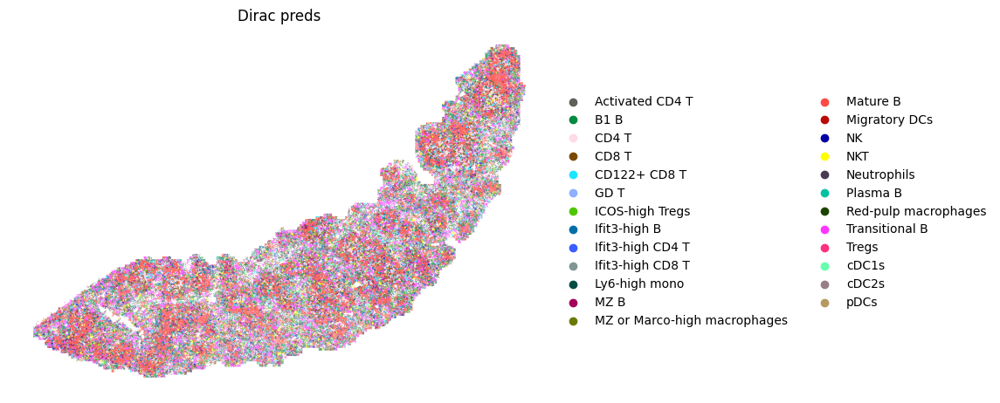

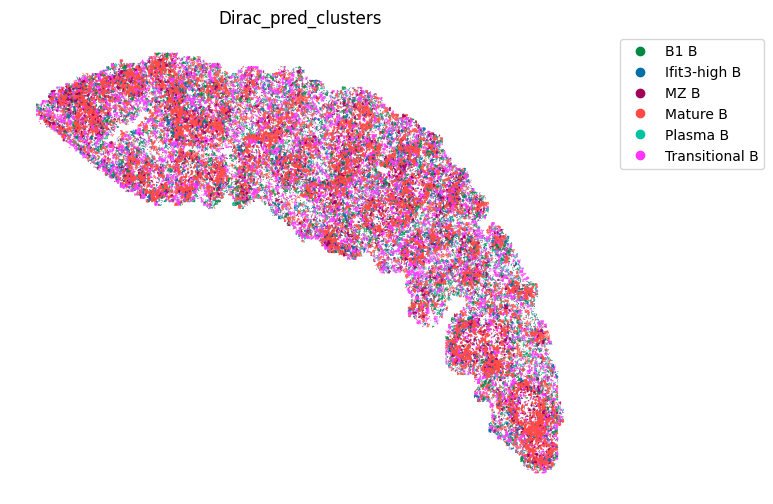

<Figure size 640x480 with 0 Axes>

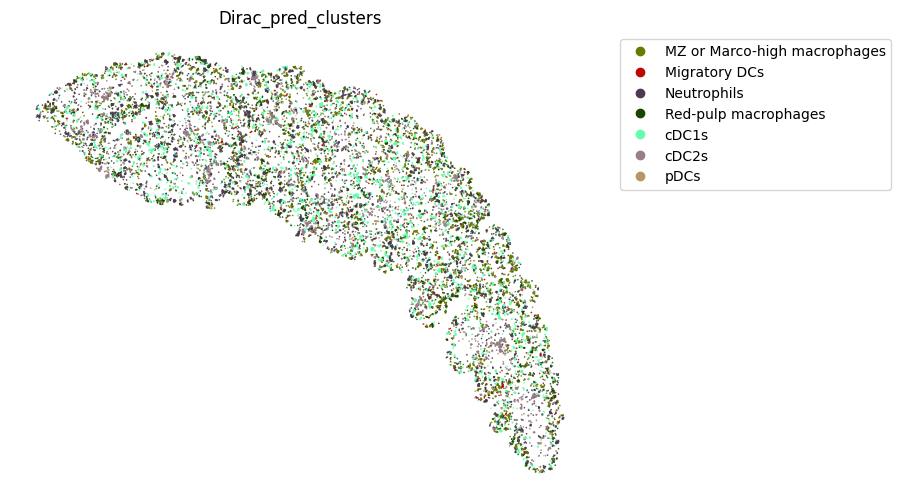

<Figure size 640x480 with 0 Axes>

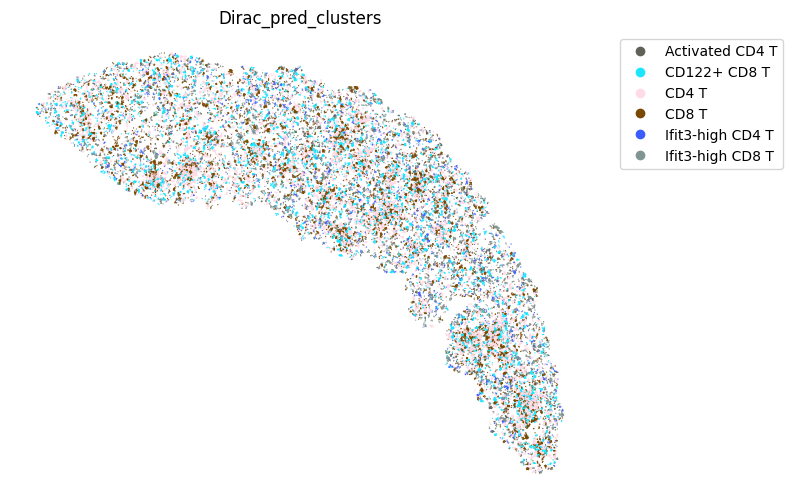

<Figure size 640x480 with 0 Axes>

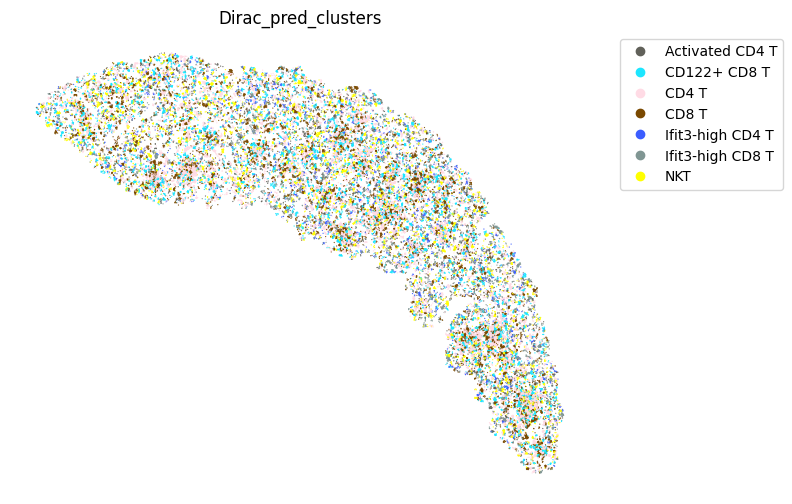

<Figure size 640x480 with 0 Axes>

In [57]:
source_adata_RNA.obsm[f"{methods}_embed"] = results["source_feat"]
target_adata_RNA.obsm[f"{methods}_embed"] = results["target_feat"]
target_adata_RNA.obs[f"{methods}_confs"] = results["target_confs"]
target_adata_RNA.obs[f"{methods}_pred_num"] = results["target_pred"]
target_adata_RNA.obs[f"{methods}_pred_clusters"] = target_adata_RNA.obs[f"{methods}_pred_num"].map(pairs)
print(Counter(target_adata_RNA.obs[f"{methods}_pred_clusters"]))


target_adata_RNA.obs[f"{methods}_pred_clusters"] = [names.replace('Cycling B/T cells', 'Cycling B or T cells') for names in target_adata_RNA.obs[f"{methods}_pred_clusters"]]
target_adata_RNA.obs[f"{methods}_pred_clusters"] = [names.replace('MZ/Marco-high macrophages', 'MZ or Marco-high macrophages') for names in target_adata_RNA.obs[f"{methods}_pred_clusters"]]


fig, ax = plt.subplots(figsize=(8, 6))

sc.pl.spatial(target_adata_RNA, 
              color=[f"{methods}_pred_clusters"], 
              frameon=False, 
              spot_size=20, 
              title=["Dirac preds"],
              img_key = None,
              palette = colormaps_clusters,
              ax=ax)
fig.savefig(os.path.join(save_path, f"{data_name}_cell_type.pdf"), bbox_inches='tight', dpi = 300)

target_adata_RNA.uns['__type'] = "UMI"
fig, ax = plt.subplots(figsize=(8, 6))
st.pl.space(
    target_adata_RNA[target_adata_RNA.obs[f"{methods}_pred_clusters"].isin(['Transitional B', 'Mature B', 'Plasma B',
                                                                                'Ifit3-high B', 'B1 B', 'MZ B'])], #, 'Erythrocytes'
    space="spatial",
    color=["Dirac_pred_clusters"],
    alpha=0.9,
    figsize=(8, 8),
    show_legend="upper left",
    dpi=300, 
    pointsize=0.05,
    color_key = colormaps_clusters,
    ax=ax,
)
plt.tight_layout()
plt.show() 
fig.savefig(os.path.join(save_path, f"{data_name}_{methods}_B_spateo.png"), dpi = 600)


fig, ax = plt.subplots(figsize=(8, 6))
st.pl.space(
    target_adata_RNA[target_adata_RNA.obs[f"{methods}_pred_clusters"].isin(['Red-pulp macrophages', 'Migratory DCs', 'pDCs', 
                                                        'cDC1s', 'cDC2s','Neutrophils', 'MZ or Marco-high macrophages'])], #, 
    space="spatial",
    color=["Dirac_pred_clusters"],
    alpha=0.9,
    figsize=(8, 8),
    show_legend="upper left",
    dpi=300, 
    pointsize=0.05,
    color_key = colormaps_clusters,
    ax=ax,
)
plt.tight_layout()
plt.show() 
fig.savefig(os.path.join(save_path, f"{data_name}_{methods}_Red_pulp_spateo.png"), dpi = 600)


fig, ax = plt.subplots(figsize=(8, 6))
st.pl.space(
    target_adata_RNA[target_adata_RNA.obs[f"{methods}_pred_clusters"].isin(['Activated CD4 T', 'Ifit3-high CD4 T','CD4 T', 'CD8 T', 
                                                                                'CD122+ CD8 T', 'Ifit3-high CD8 T'])], #, 
    space="spatial",
    color=["Dirac_pred_clusters"],
    alpha=0.9,
    figsize=(8, 8),
    show_legend="upper left",
    dpi=300, 
    pointsize=0.05,
    color_key = colormaps_clusters,
    ax=ax,
)
plt.tight_layout()
plt.show() 
fig.savefig(os.path.join(save_path, f"{data_name}_{methods}_T_spateo.png"), dpi = 600)

fig, ax = plt.subplots(figsize=(8, 6))
st.pl.space(
    target_adata_RNA[target_adata_RNA.obs[f"{methods}_pred_clusters"].isin(['Activated CD4 T', 'Ifit3-high CD4 T','CD4 T', 'CD8 T', 
                                                                                'CD122+ CD8 T', 'Ifit3-high CD8 T', 'NKT'])], #, 
    space="spatial",
    color=["Dirac_pred_clusters"],
    alpha=0.9,
    figsize=(8, 8),
    show_legend="upper left",
    dpi=300, 
    pointsize=0.05,
    color_key = colormaps_clusters,
    ax=ax,
)
plt.tight_layout()
plt.show() 
fig.savefig(os.path.join(save_path, f"{data_name}_{methods}_T_NKT_spateo.png"), dpi = 600)

# save_fig_path = os.path.join(save_path, "Single_cell_type")
# if not os.path.exists(save_fig_path):
#     os.makedirs(save_fig_path)

# for i in target_adata_RNA.obs[f"{methods}_pred_clusters"].unique():
#     fig, ax = plt.subplots(figsize=(8, 6))
#     sc.pl.spatial(target_adata_RNA, 
#                   color=[f"{methods}_pred_clusters"], 
#                   groups=[i], 
#                   frameon=False, 
#                   spot_size=20, 
#                   title=["Dirac preds"], 
#                   palette = colormaps_clusters,
#                   img_key = None,
#                   ax=ax,
#                  )
#     fig.savefig(os.path.join(save_fig_path, f"{data_name}_{i}.pdf"), bbox_inches='tight', dpi = 300)

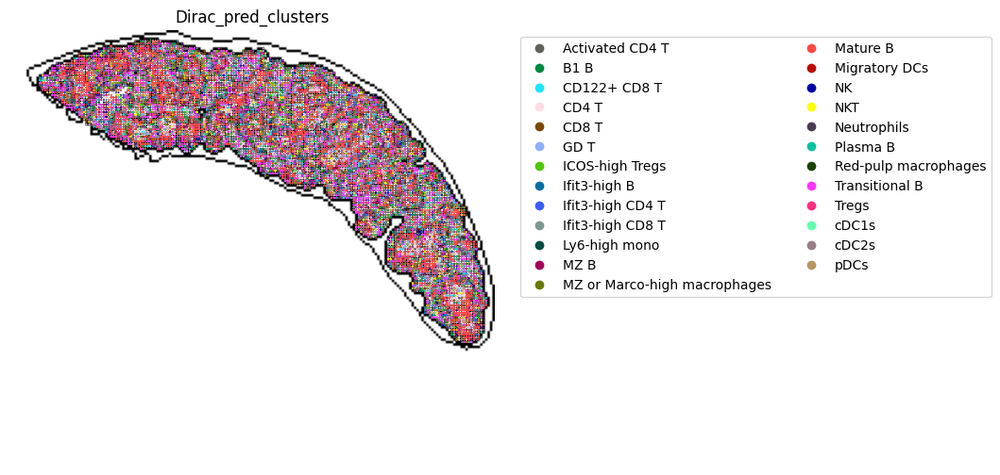

<Figure size 640x480 with 0 Axes>

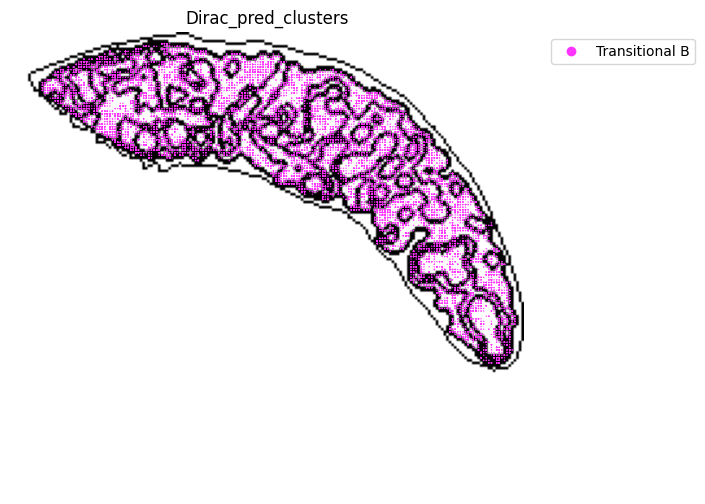

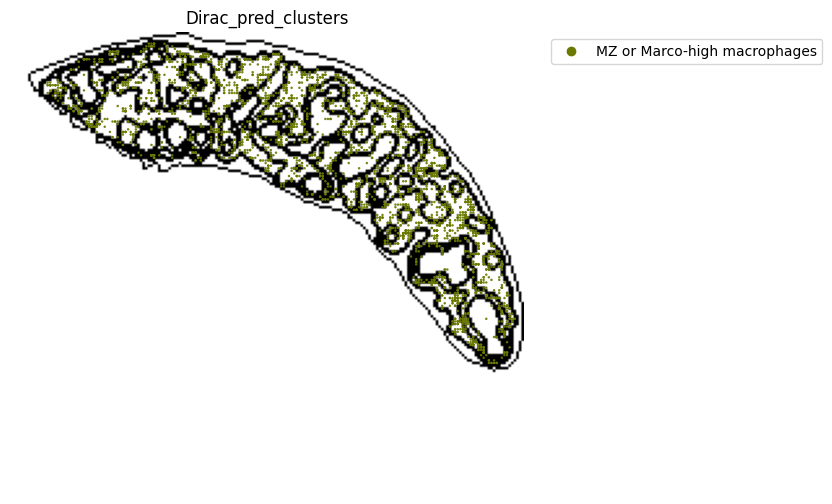

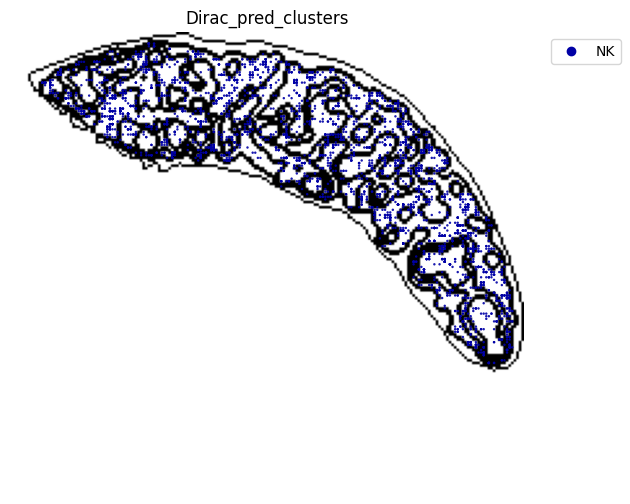

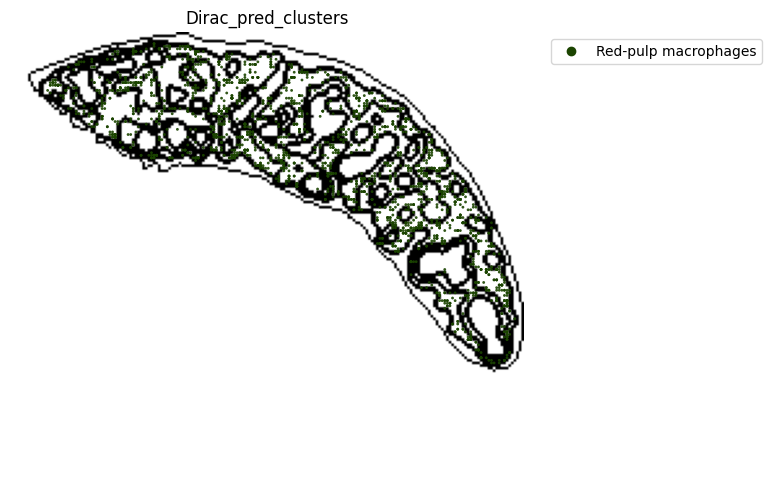

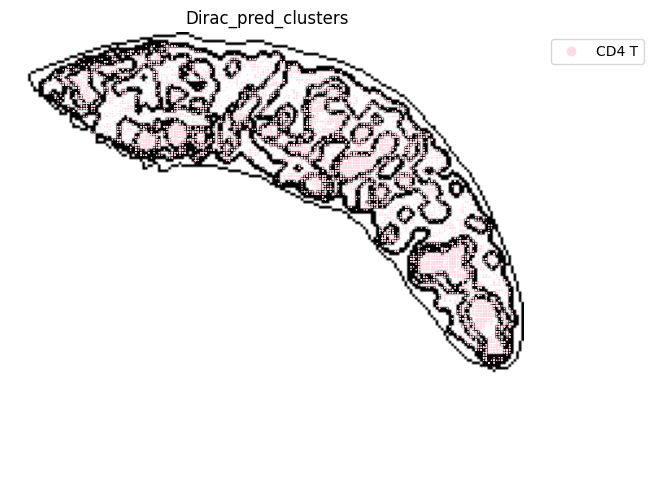

...

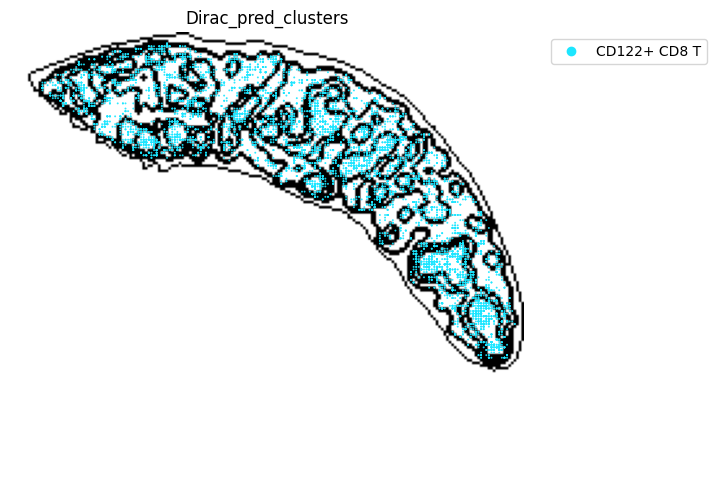

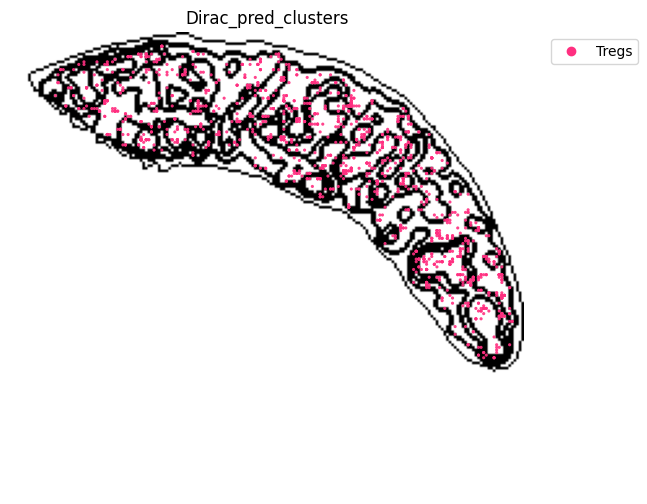

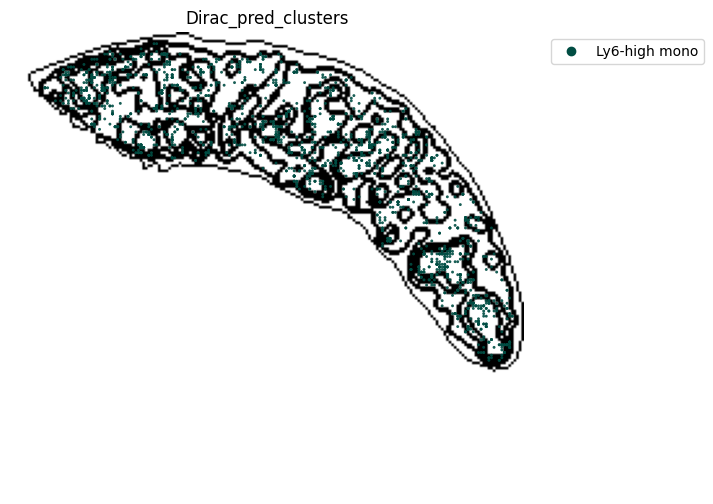

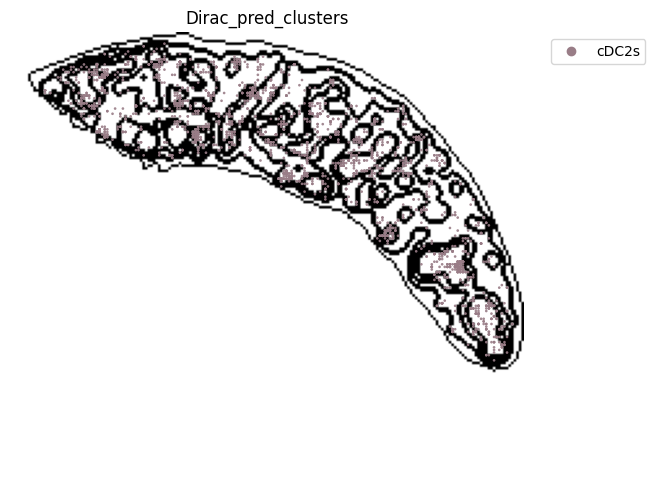

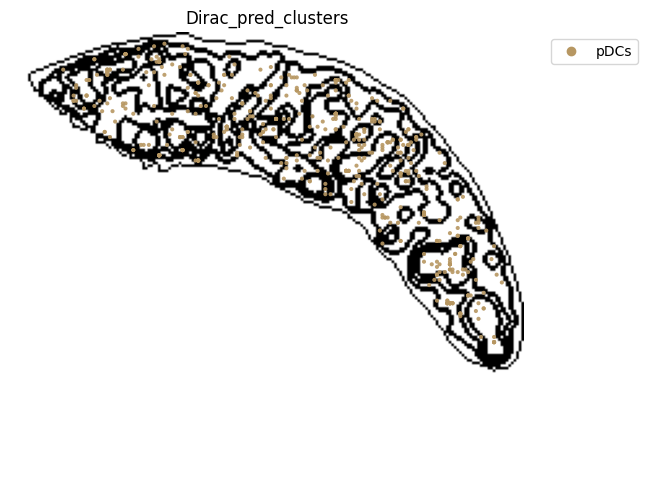

In [59]:
target_adata_RNA.obsm['spatial_bin100'] = target_adata_RNA.obsm['spatial'] // 100

target_adata_RNA = st.io.read_image(
    target_adata_RNA,
    filename=os.path.join("/home/project/11003054/changxu/Projects/SpaGNNs/Review/Re_2024_10_29/section5/Results/C03833D6_bin100_Dirac/20240925142432", "spatial_domains.png"),
    img_layer="layer1",
    slice="slice1",
    scale_factor=1,
)

target_adata_RNA.uns["__type"] = "UMI"

fig, ax = plt.subplots(figsize=(8, 6))
st.pl.space(
    target_adata_RNA,
    space="spatial_bin100",
    color=["Dirac_pred_clusters"],
    alpha=0.9,
    figsize=(5, 3),
    show_legend="upper left",
    img_layers = "layer1",
    slices="slice1",
    dpi=300, 
    pointsize=0.2,
    color_key = colormaps_clusters,
    ax=ax,
)
plt.tight_layout()
plt.show() 
fig.savefig(os.path.join(save_path, f"{data_name}_{methods}_cell_type_outlines.png"), dpi = 600)



save_fig_path = os.path.join(save_path, "Single_cell_type_outline")
if not os.path.exists(save_fig_path):
    os.makedirs(save_fig_path)

for i in target_adata_RNA.obs[f"{methods}_pred_clusters"].unique():
    fig, ax = plt.subplots(figsize=(8, 6))
    st.pl.space(
        target_adata_RNA[target_adata_RNA.obs[f"{methods}_pred_clusters"].isin([i])],
        space = "spatial_bin100",
        color = ["Dirac_pred_clusters"],
        alpha = 0.9,
        figsize = (5, 3),
        show_legend = "upper left",
        img_layers = "layer1",
        slices="slice1",
        dpi=300, 
        pointsize=0.05,
        color_key = colormaps_clusters,
        ax=ax)
    fig.savefig(os.path.join(save_fig_path, f"{data_name}_{i}.png"), dpi = 600)

######### save data
target_adata_RNA.write(os.path.join(save_path, f"{data_name}_{methods}_{use_counts}_target.h5ad"), compression="gzip")
source_adata_RNA.write(os.path.join(save_path, f"{data_name}_{methods}_{use_counts}_source.h5ad"), compression="gzip")

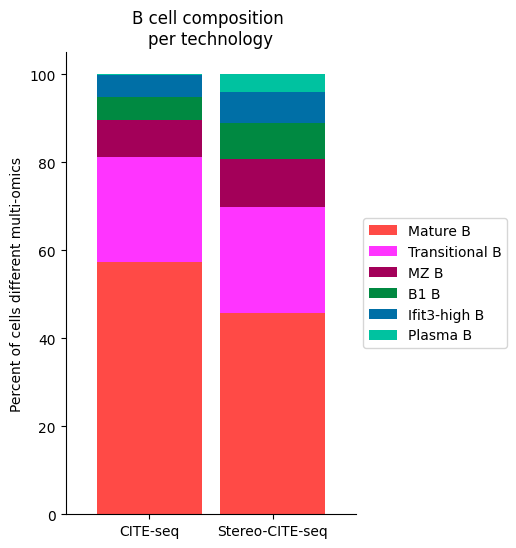

In [60]:
############
# Use this ordering of cell types for consistency
import seaborn as sns

Bcell_clust_onevall = ['Plasma B', 'Transitional B', 'Mature B', 'Ifit3-high B', 'B1 B', 'MZ B']

# Plot composition of spleen and lymph node B cell subsets as a stacked bar chart

# Calculate cluster composition of each tissue
# Get spleen/LN cells
source_spleen_B = source_adata_RNA[source_adata_RNA.obs["cell_types"].isin(Bcell_clust_onevall)]
target_spleen_B = target_adata_RNA[target_adata_RNA.obs["Dirac_pred_clusters"].isin(Bcell_clust_onevall)]


# Get cluster labels
source_spleen_clusters = pd.Series(source_spleen_B.obs["cell_types"].values)
target_spleen_clusters = pd.Series(target_spleen_B.obs["Dirac_pred_clusters"].values)

# Calculate cluster composition (cells as a percent of total in that tissue)
source_spleen_comp  = source_spleen_clusters.value_counts()/np.sum(source_spleen_clusters.value_counts())*100
target_spleen_comp = target_spleen_clusters.value_counts()/np.sum(target_spleen_clusters.value_counts())*100

# Make data frame of composition

composition_df = np.transpose(pd.DataFrame({"CITE-seq":source_spleen_comp, "Stereo-CITE-seq": target_spleen_comp}))
composition_df

# Plot tissue composition as stacked bar chart

fig, ax = plt.subplots(figsize=(3.75, 6)) # 5,8

composition_df.plot.bar(stacked = True, ax = ax, width = 0.85, color=colormaps_clusters),
plt.ylabel("Percent of cells different multi-omics")
plt.title("B cell composition \nper technology")
ax.legend(bbox_to_anchor = (1, 0.5), loc = "center left") # move legend to outside of plot
plt.xticks(rotation = 0)
sns.despine()

fig.savefig(os.path.join(save_path,"Bcell_composition_per_tissue.pdf"), dpi=300, bbox_inches='tight')

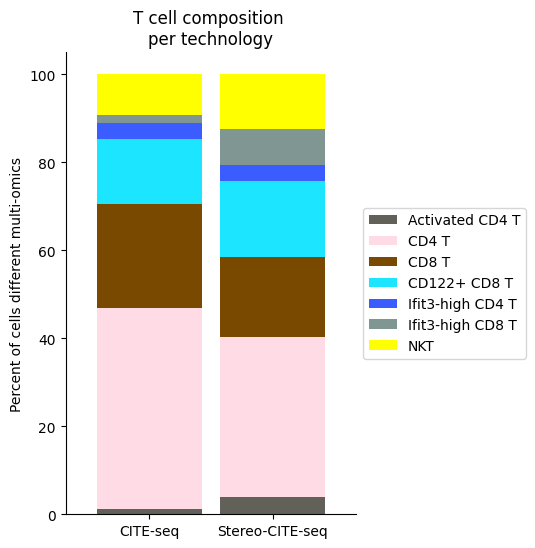

In [61]:
############
# Use this ordering of cell types for consistency
import seaborn as sns

Tcell_clust_onevall = ['Ifit3-high CD4 T','CD4 T', 'CD8 T', 'CD122+ CD8 T', 'Ifit3-high CD8 T', 'Activated CD4 T','NKT']

# Plot composition of spleen and lymph node B cell subsets as a stacked bar chart

# Calculate cluster composition of each tissue
# Get spleen/LN cells
source_spleen_T = source_adata_RNA[source_adata_RNA.obs["cell_types"].isin(Tcell_clust_onevall)]
target_spleen_T = target_adata_RNA[target_adata_RNA.obs["Dirac_pred_clusters"].isin(Tcell_clust_onevall)]


# Get cluster labels
source_spleen_clusters = pd.Series(source_spleen_T.obs["cell_types"].values)
target_spleen_clusters = pd.Series(target_spleen_T.obs["Dirac_pred_clusters"].values)

# Calculate cluster composition (cells as a percent of total in that tissue)
source_spleen_comp  = source_spleen_clusters.value_counts()/np.sum(source_spleen_clusters.value_counts())*100
target_spleen_comp = target_spleen_clusters.value_counts()/np.sum(target_spleen_clusters.value_counts())*100

# Make data frame of composition

composition_df = np.transpose(pd.DataFrame({"CITE-seq":source_spleen_comp, "Stereo-CITE-seq": target_spleen_comp}))
composition_df

# Plot tissue composition as stacked bar chart

fig, ax = plt.subplots(figsize=(3.75, 6)) # 5,8

composition_df.plot.bar(stacked = True, ax = ax, width = 0.85, color=colormaps_clusters),
plt.ylabel("Percent of cells different multi-omics")
plt.title("T cell composition \nper technology")
ax.legend(bbox_to_anchor = (1, 0.5), loc = "center left") # move legend to outside of plot
plt.xticks(rotation = 0)
sns.despine()

fig.savefig(os.path.join(save_path,"Tcell_composition_per_tissue.pdf"), dpi=300, bbox_inches='tight')

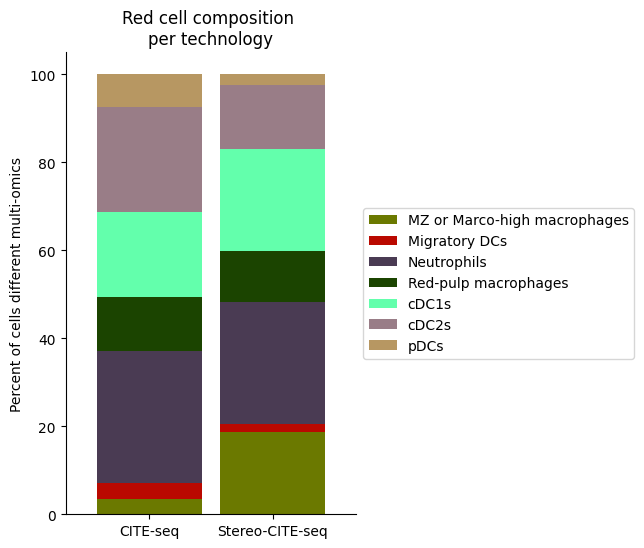

In [62]:
############
# Use this ordering of cell types for consistency
import seaborn as sns

Rcell_clust_onevall = ['Red-pulp macrophages', 'Migratory DCs', 'pDCs', 'cDC1s', 'cDC2s','Neutrophils', 'MZ or Marco-high macrophages']

# Plot composition of spleen and lymph node B cell subsets as a stacked bar chart

# Calculate cluster composition of each tissue
# Get spleen/LN cells
source_spleen_R = source_adata_RNA[source_adata_RNA.obs["cell_types"].isin(Rcell_clust_onevall)]
target_spleen_R = target_adata_RNA[target_adata_RNA.obs["Dirac_pred_clusters"].isin(Rcell_clust_onevall)]


# Get cluster labels
source_spleen_clusters = pd.Series(source_spleen_R.obs["cell_types"].values)
target_spleen_clusters = pd.Series(target_spleen_R.obs["Dirac_pred_clusters"].values)

# Calculate cluster composition (cells as a percent of total in that tissue)
source_spleen_comp  = source_spleen_clusters.value_counts()/np.sum(source_spleen_clusters.value_counts())*100
target_spleen_comp = target_spleen_clusters.value_counts()/np.sum(target_spleen_clusters.value_counts())*100

# Make data frame of composition

composition_df = np.transpose(pd.DataFrame({"CITE-seq":source_spleen_comp, "Stereo-CITE-seq": target_spleen_comp}))
composition_df

# Plot tissue composition as stacked bar chart

fig, ax = plt.subplots(figsize=(3.75, 6)) # 5,8

composition_df.plot.bar(stacked = True, ax = ax, width = 0.85, color=colormaps_clusters),
plt.ylabel("Percent of cells different multi-omics")
plt.title("Red cell composition \nper technology")
ax.legend(bbox_to_anchor = (1, 0.5), loc = "center left") # move legend to outside of plot
plt.xticks(rotation = 0)
sns.despine()

fig.savefig(os.path.join(save_path,"Rcell_composition_per_tissue.pdf"), dpi=300, bbox_inches='tight')

In [41]:
save_path = "/home/project/11003054/changxu/Projects/SpaGNNs/Review/Re_2024_10_29/section5/Results/C03833D6_cellbin_Dirac_annotation/20241107183627_final"

## Step 3: Comparison of cell proportions, including CITE-seq, Stereo-CITE-seq (Joint, Only RNA, Only Protein)

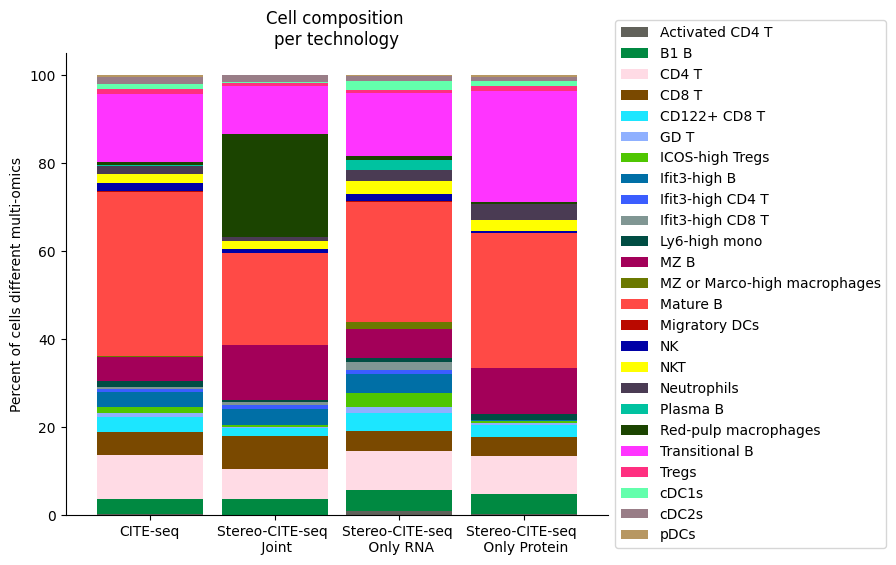

In [42]:
############# Plot the cell type composition across all datasets

# Import seaborn for visualization
import seaborn as sns

# Get the cluster labels for different datasets
source_spleen_clusters = pd.Series(source_adata_total.obs["cell_types"].values)  # Cell types for the source dataset
target_spleen_clusters_total = pd.Series(target_adata_total.obs["Dirac_pred_clusters"].values)  # Predicted clusters for target dataset (combined RNA + Protein)
target_spleen_clusters_RNA = pd.Series(target_adata_RNA.obs["Dirac_pred_clusters"].values)  # Predicted clusters for target dataset (RNA only)
target_spleen_clusters_Protein = pd.Series(target_adata_protein.obs["Dirac_pred_clusters"].values)  # Predicted clusters for target dataset (Protein only)

# Calculate the composition of each cell type as a percentage of the total cell population in that tissue
source_spleen_comp = source_spleen_clusters.value_counts()/np.sum(source_spleen_clusters.value_counts())*100  # Source dataset composition
target_spleen_comp_total = target_spleen_clusters_total.value_counts()/np.sum(target_spleen_clusters_total.value_counts())*100  # Target dataset composition (combined)
target_spleen_comp_RNA = target_spleen_clusters_RNA.value_counts()/np.sum(target_spleen_clusters_RNA.value_counts())*100  # Target dataset composition (RNA only)
target_spleen_comp_Protein = target_spleen_clusters_Protein.value_counts()/np.sum(target_spleen_clusters_Protein.value_counts())*100  # Target dataset composition (Protein only)

# Combine the compositions into a single DataFrame for easier visualization
composition_df = np.transpose(pd.DataFrame({
    "CITE-seq": source_spleen_comp,  # Source dataset composition
    "Stereo-CITE-seq \n Joint": target_spleen_comp_total,  # Target dataset composition (combined RNA + Protein)
    "Stereo-CITE-seq \n Only RNA": target_spleen_comp_RNA,  # Target dataset composition (RNA only)
    "Stereo-CITE-seq \n Only Protein": target_spleen_comp_Protein,  # Target dataset composition (Protein only)
}))

# Show the composition DataFrame for inspection
composition_df

# Plot tissue composition as a stacked bar chart
fig, ax = plt.subplots(figsize=(7, 6))  # Set the figure size

# Plot the stacked bar chart with the composition data
composition_df.plot.bar(stacked=True, ax=ax, width=0.85, color=colormaps_clusters)

# Set labels and title for the plot
plt.ylabel("Percent of cells from different multi-omics technologies")
plt.title("Cell composition \nper technology")

# Adjust the legend to be outside of the plot
ax.legend(bbox_to_anchor=(1, 0.5), loc="center left")

# Set x-ticks to be horizontal (0-degree rotation)
plt.xticks(rotation=0)

# Remove the top and right spines for a cleaner look
sns.despine()

# Save the plot as a PDF in the specified save path
fig.savefig(os.path.join(save_path, "allcell_composition_per_tissue_including_Protein_RNA_joint.pdf"), dpi=300, bbox_inches='tight')

# Show the plot
plt.show()

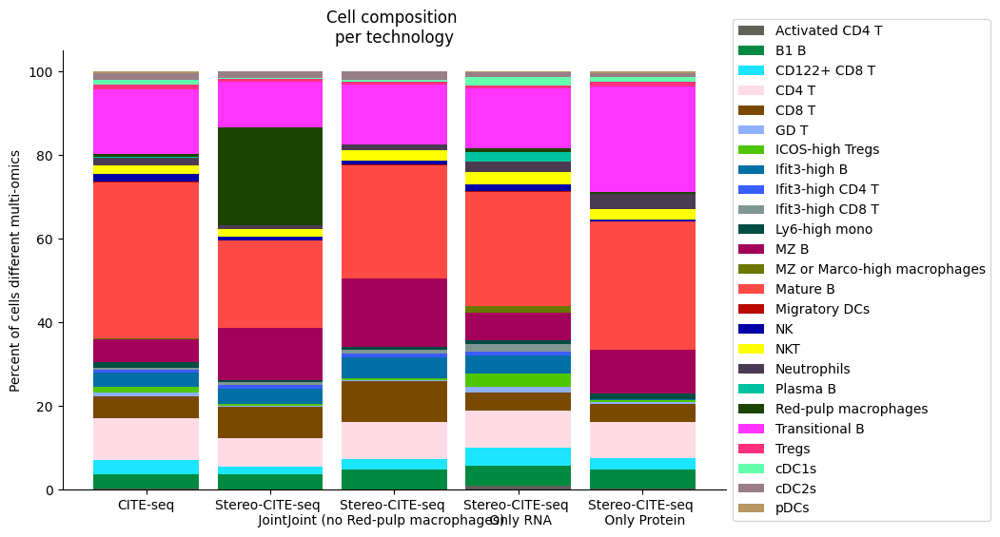

In [43]:
############# Plot the cell composition across all datasets (excluding "Red-pulp macrophages")

# Import seaborn for plotting
import seaborn as sns

# Get the cluster labels for the different datasets
source_spleen_clusters = pd.Series(source_adata_total.obs["cell_types"].values)  # Cell types for the source dataset
target_spleen_clusters_total = pd.Series(target_adata_total.obs["Dirac_pred_clusters"].values)  # Predicted clusters for target dataset (combined RNA + Protein)
target_spleen_clusters_RNA = pd.Series(target_adata_RNA.obs["Dirac_pred_clusters"].values)  # Predicted clusters for target dataset (RNA only)
target_spleen_clusters_Protein = pd.Series(target_adata_protein.obs["Dirac_pred_clusters"].values)  # Predicted clusters for target dataset (Protein only)

# Remove "Red-pulp macrophages" from the target dataset and calculate the clusters again
target_spleen_clusters_Ery = pd.Series(target_adata_total[~target_adata_total.obs["Dirac_pred_clusters"].isin(['Red-pulp macrophages'])].obs["Dirac_pred_clusters"].values)

# Calculate the composition of each cell type as a percentage of the total cells in that tissue
source_spleen_comp = source_spleen_clusters.value_counts()/np.sum(source_spleen_clusters.value_counts())*100  # Source dataset composition
target_spleen_comp_total = target_spleen_clusters_total.value_counts()/np.sum(target_spleen_clusters_total.value_counts())*100  # Target dataset composition (combined RNA + Protein)
target_spleen_comp_RNA = target_spleen_clusters_RNA.value_counts()/np.sum(target_spleen_clusters_RNA.value_counts())*100  # Target dataset composition (RNA only)
target_spleen_comp_Protein = target_spleen_clusters_Protein.value_counts()/np.sum(target_spleen_clusters_Protein.value_counts())*100  # Target dataset composition (Protein only)
target_spleen_comp_Ery = target_spleen_clusters_Ery.value_counts()/np.sum(target_spleen_clusters_Ery.value_counts())*100  # Target dataset composition (excluding "Red-pulp macrophages")

# Combine the composition data into a single DataFrame for visualization
composition_df = np.transpose(pd.DataFrame({
    "CITE-seq": source_spleen_comp,  # Source dataset composition
    "Stereo-CITE-seq \n Joint": target_spleen_comp_total,  # Target dataset composition (combined RNA + Protein)
    "Stereo-CITE-seq \n Joint (no Red-pulp macrophages)": target_spleen_comp_Ery,  # Target dataset composition (excluding "Red-pulp macrophages")
    "Stereo-CITE-seq \n Only RNA": target_spleen_comp_RNA,  # Target dataset composition (RNA only)
    "Stereo-CITE-seq \n Only Protein": target_spleen_comp_Protein,  # Target dataset composition (Protein only)
}))

# Show the composition DataFrame for inspection
composition_df

# Plot tissue composition as a stacked bar chart
fig, ax = plt.subplots(figsize=(9, 6))  # Set figure size to 9x6 inches

# Plot the stacked bar chart with the composition data
composition_df.plot.bar(stacked=True, ax=ax, width=0.85, color=colormaps_clusters)

# Add labels and title to the plot
plt.ylabel("Percent of cells from different multi-omics technologies")
plt.title("Cell composition \nper technology")

# Adjust the legend to be outside the plot area
ax.legend(bbox_to_anchor=(1, 0.5), loc="center left")

# Rotate x-tick labels to be horizontal (0-degree rotation)
plt.xticks(rotation=0)

# Remove the top and right spines for a cleaner look
sns.despine()

# Save the plot as a PDF in the specified save path
fig.savefig(os.path.join(save_path, "allcell_composition_per_tissue_including_Protein_RNA_joint_Red_pulp_macrophages.pdf"), dpi=300, bbox_inches='tight')

# Display the plot
plt.show()

In [44]:
save_path

'/home/project/11003054/changxu/Projects/SpaGNNs/Review/Re_2024_10_29/section5/Results/C03833D6_cellbin_Dirac_annotation/20241107183627_final'

In [47]:
target_adata_total

AnnData object with n_obs × n_vars = 249452 × 930
    obs: 'dnbCount', 'area', 'orig.ident', 'x', 'y', 'region_domain_from_bins', 'region_domain_from_bin100', 'n_genes', 'batch', 'Dirac_confs', 'Dirac_pred_num', 'Dirac_pred_clusters'
    var: 'mean', 'std'
    uns: 'Dirac_pred_clusters_colors', '__type', 'log1p', 'spatial'
    obsm: 'Dirac_embed', 'X_HVG', 'X_spatial_bin100', 'spatial', 'spatial_bin100'

In [48]:
source_adata_total

AnnData object with n_obs × n_vars = 16268 × 930
    obs: 'n_protein_counts', 'n_proteins', 'seurat_hash_id', 'batch_indices', 'hash_id', 'n_genes', 'percent_mito', 'leiden_subclusters', 'cell_types', 'cell_types_num', 'batch'
    var: 'mean', 'std'
    uns: 'log1p', 'pca'
    obsm: 'Dirac_embed', 'X_HVG', 'X_pca'
    varm: 'PCs'